#### Пояснение проверяющему: в комментариях к блокам я буду пояснять логику своих действий, и некоторые сложные расчеты, а после блока размышлять о результатах. Порядок некоторых блоков может показаться не вытекающим один из другого. Это связано с тем, что я стараюсь не множить переменные и перезаписываю таблицы в одни и теже переменные. Поэтому когда я вижу необохдимость дополнить решение каким-то новым блоком, я вставляю его не в конец, именно к тому блоку где переменная в данный момент содержит нужные мне таблицы. Для уточнения чего-либо со мной можно связаться по телеграму igor_pvalue

#### Код содержит базовые визуализации. Более сложные и интерактивные визуализации я создал в дашборде на DataLens. Ссылка https://datalens.yandex/tx99mitwhx92d. Для корректного отображения визуализаций используйте последние версии браузеров. Верстка только под 1920х1080

---

Задание

В апреле-августе 2025г. у клиента ПИМ произошло снижение выкупа заказов. Необходимо проанализировать имеющиеся данные 
и сделать предположения о возможных причинах, повлиявших на снижение выкупа.

Вам дана выгрузка - история заказов клиента с января по сентябрь 2025г.

Содержание выгрузки:
- id - номер заказа
- created_at - дата создания заказа
- ds_status - статус (выкуплен/не выкуплен)
- type_delivery - тип доставки (ПВЗ, курьер, постамат)
- recipient_region - регион получателя заказа
- recipient_region_number - номер региона получателя заказа
- fail_reason - причина отказа от заказа
- total_cost_for_recipient - цена заказа для покупателя (если цена ниже 300 руб., то значит заказ был предоплачен, если выше, то оплата при получении)

Необходимо:
1. Провести анализ причин отказа от заказа (fail_reason)
2. Оформить результат анализа любым удобным для вас способом

---

In [1]:
# импорт необходимых библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings 
warnings.filterwarnings('ignore')

# отображение таблиц целиком
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_rows', 30)

In [2]:
# загружаю датасет 
df = pd.read_json('datapim.json')

In [3]:
df

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,total_cost_for_recipient
0,1,2025-08-11,1,None,None,NaN,None,0.0
1,2,2025-09-08,1,None,None,NaN,None,0.0
2,3,2025-05-19,0,None,None,NaN,None,0.0
3,4,2025-05-26,1,None,None,NaN,None,0.0
4,5,2025-05-19,0,None,None,NaN,None,0.0
...,...,...,...,...,...,...,...,...
359694,359695,2025-06-11,1,pvz,ЯРОСЛАВСКАЯ ОБЛАСТЬ,76.0,None,8870.0
359695,359696,2025-07-05,0,pvz,ЯРОСЛАВСКАЯ ОБЛАСТЬ,76.0,Возврат: Истек срок хранения,8870.0
359696,359697,2025-04-27,0,pvz,ЯРОСЛАВСКАЯ ОБЛАСТЬ,76.0,Возврат: Истек срок хранения,18470.0
359697,359698,2025-01-29,1,pvz,ЯРОСЛАВСКАЯ ОБЛАСТЬ,76.0,None,13075.0


**Приступаю к предварительной чистке и разведке данных**

In [4]:
# проверяю тип данных
df.dtypes

id                                   int64
created_at                  datetime64[ns]
ds_status                            int64
type_delivery                       object
recipient_region                    object
recipient_region_number            float64
fail_reason                         object
total_cost_for_recipient           float64
dtype: object

*Все данные нужных типов, разве что recipient_region_number и total_cost_for_recipient лучше быть в int, а не float. Пока 
это не принципиально. Для исправления типа нужно решить вопрос с наличием Nan*

In [5]:
# проверяю номера заказов на уникальность
df['id'].nunique()

359699

In [6]:
# проверяю номера заказов на дубликаты
df['id'].duplicated().sum()

0

*В датасете нет дубликатов заказов, все 359699 строк содержат уникальные заказы*

In [7]:
# проверяю диапазон дат датасета

print(df['created_at'].min(), df['created_at'].max())

2025-01-02 00:00:00 2025-09-30 00:00:00


*Даты в нужном диапазоне январь-сентябрь 2025. И в нужном формате ГГГГ-ММ-ДД*

In [8]:
# проверяю значения типов доставки
df.type_delivery.unique()

array([None, 'courier', 'pvz', 'postamat'], dtype=object)

*Имеется 3 типа: courier, pvz, postamat и неизвестный тип None*

In [9]:
# проверяю значения статуса доставки
df.ds_status.unique()

array([1, 0], dtype=int64)

*Имеется только 2 типа значения: 1 для выкупленных, 0 для не выкупленных*

In [10]:
# считаю количество Nan в датасете
nan_count = df.isna().sum().to_frame().T
nan_count

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,total_cost_for_recipient
0,0,0,0,17177,1280,1281,242074,0


In [11]:
# считаю количество Nan в процентах от всего датасета и объединяют результаты в одну таблицу
nan_percent = round((df.isna().sum() / len(df)) * 100, 2).to_frame().T
pd.concat([nan_count, nan_percent])
nans_result = pd.concat([nan_count, nan_percent])
nans_result.index = ['nan_count', 'nan_percent']
nans_result

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,total_cost_for_recipient
nan_count,0.0,0.0,0.0,17177.00,1280.00,1281.00,242074.0,0.0
nan_percent,0.0,0.0,0.0,4.78,0.36,0.36,67.3,0.0


*Большой процент Nan в столбце fail_reason выглядит резонным, т.к. доставленные заказы не должны содержать причину отказа. А вот type_delivery, recipient_region, recipient_region_number выглядят как битые данные.  
Количество Nan в столбцах recipient_region и recipient_region_number одинаково, что говорит о существовании какой-то зависимости. Изу их отдельно* 

In [12]:
# вывожу Nan в столбцах recipient_region и recipient_region_number и считаю Nan в других столбцах
df.query('recipient_region.isna() and recipient_region_number.isna()').isna().sum().to_frame().T

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,total_cost_for_recipient
0,0,0,0,672,1280,1280,1280,0


*Количество Nan в столбце fail_reason совпадает. А вот type_delivery имеет отличные значения*

In [13]:
# найду не Nan значения столбца type_delivery
df.query('recipient_region.isna() and recipient_region_number.isna() and type_delivery.notna()').type_delivery.unique()

array(['courier'], dtype=object)

*Единственное не Nan значение это 'courier'*

In [14]:
# посчитаю количество не Nan строк type_delivery (где будет 'courier')
df.query('recipient_region.isna() and recipient_region_number.isna() and type_delivery.notna()').type_delivery.count()

608

In [15]:
# посчитаю статусы выкупа
df.query('recipient_region.isna() and recipient_region_number.isna()').ds_status.value_counts()

1    1272
0       8
Name: ds_status, dtype: int64

*Чуть менее чем все заказы имеют статус выкупленные. Я опущу эти 8 невыкупленных, и для выводов буду считать, что все выкуплены*

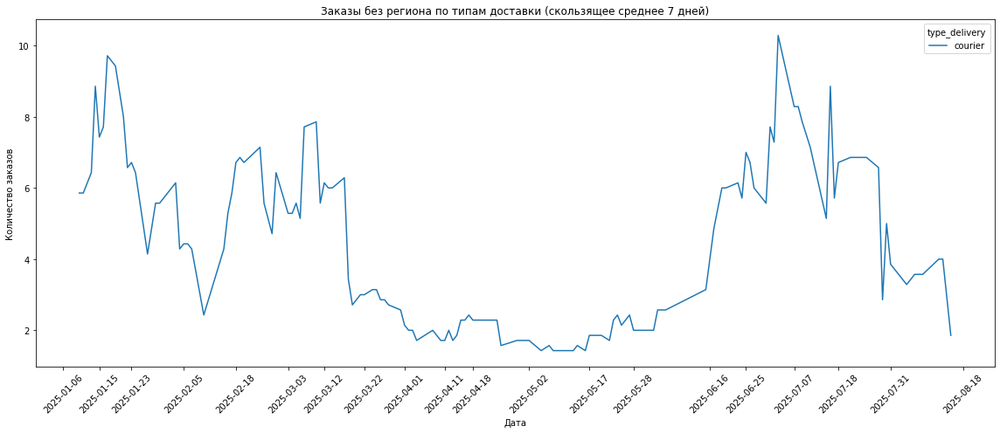

In [16]:
# построю график рапределения этих заказов по датам
a = df.query('recipient_region.isna() and recipient_region_number.isna()')

a = a.groupby([a['created_at'].dt.date, 'type_delivery'])['id'].count().reset_index(name='orders_count')

a['rolling_7'] = a.groupby('type_delivery')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='type_delivery', style='type_delivery', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Заказы без региона по типам доставки (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Вывод: в таблице имеются 1280 заказов с None значениями региона. Все они имеют статус выкупленных. Они имеют только 2 типа доставки: None в количестве 672 и 'courier' в количестве 608. Для исследования можно иметь ввиду, что возможно они оказывали какое то влияние. Например завышали процент выкупленных заказов, хотя по факту являлись фейковыми заказами. Посмотрю временной период этих заказов.*

In [17]:
# посчитаю количество выкупленных и не выкупленных заказов с неизвестным типом доставки
df.query('type_delivery.isna()').ds_status.value_counts()

1    11038
0     6139
Name: ds_status, dtype: int64

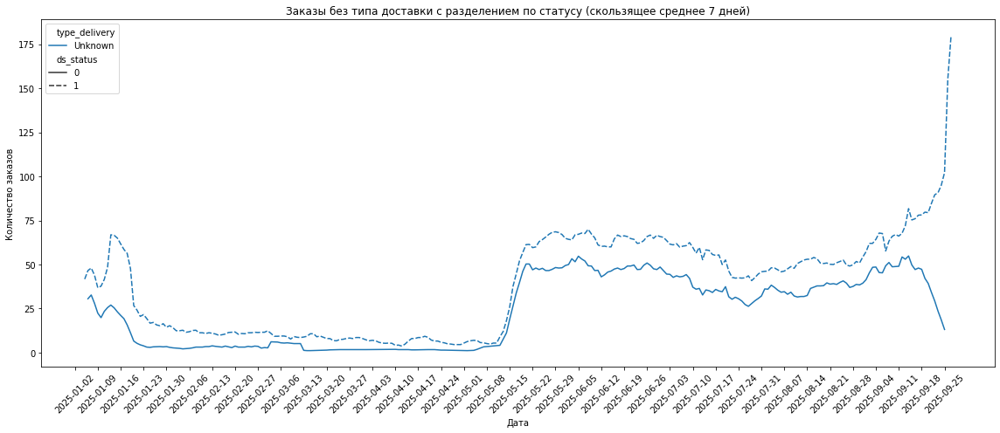

In [18]:
# построю график рапределения этих заказов по датам
a = df.query('type_delivery.isna()')

a['type_delivery'] = a['type_delivery'].fillna('Unknown')

a = a.groupby([a['created_at'].dt.date, 'type_delivery', 'ds_status'])['id'].count().reset_index(name='orders_count')

a['rolling_7'] = a.groupby(['type_delivery', 'ds_status'])['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=[0,1], drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='type_delivery', style='ds_status', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Заказы без типа доставки с разделением по статусу (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Заказы с None типом доставки имели пик в начале января, потом оппустились до нуля, и вновь появились в начале мая, поднявшись до определенного уровня на котором и удерживались до конца датасета. Их них 35.74% имеют статус не выкупленные, 64.25% выкупленные*

In [19]:
# проверяю максимальную и минимальную дату датасета
print(df.query('recipient_region.isna() and recipient_region_number.isna()').created_at.min())
print(df.query('recipient_region.isna() and recipient_region_number.isna()').created_at.max())

2025-01-06 00:00:00
2025-09-30 00:00:00


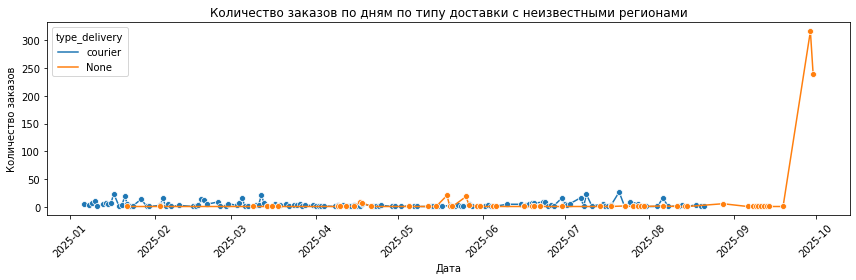

In [20]:
# построю график распределения по дням и группировкой по type_delivery
# поскольку там присутствуют None, которые пропадут при группировке, заменяю их явно на строку None

a = df.query('recipient_region.isna() and recipient_region_number.isna()')
a['type_delivery'] = a['type_delivery'].fillna('None')

plt.figure(figsize=(12,4))
sns.lineplot(data=a.groupby([a['created_at'].dt.date, 'type_delivery'])['id'].count().reset_index(name='orders_count'), 
             x='created_at', y='orders_count', hue='type_delivery', marker='o')

plt.xticks(rotation=45)
plt.title('Количество заказов по дням по типу доставки с неизвестными регионами')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

In [21]:
# посчитаю процент битых заказов от всего датасета
len(df.query('recipient_region.isna() and recipient_region_number.isna()')) / len(df) * 100

0.3558530882765868

*Вывод: в датасете имеется 1280 битых заказов с неизвестным регионом доставки. Они составляю 0,3% от всего датасета. В половине из них неизвестен тип доставки, а в другой половине это тип "courier". Все они имеют статус выкупленных. Цены этих заказов рандомны и не имеют какой то системности. График распределения по датам этих заказов показывает линейность, и имеет выраженный всплеск в конце сентября, в период который нас уже не интересует. Буду считать эти заказы оказывающими мизерное влияение.*

*Возвращаюсь к исходному датасету. Я обратил внимание, что даты идут в рандомном порядке относительно номеров заказов. При этом номера заказов идут по возрастанию относительно алфавитного порядка названия регионов. Очевидно, что это не настоящие номера заказов, эти цифры были присвоены при выгрузке данных для этого датасета. Несоответсвие порядка номеров с порядком дат не оказывает никакого влияения. Id заказа это просто уникальное значения, и их порядок не оказывает никакого влияения. Поэтому я перезапишу датасет в порядке дат по возрастанию* 

In [22]:
# перезаписываю датасет в порядке возрастания даты создания заказ, столбец created_at
df = df.sort_values('created_at').reset_index(drop=True)

In [23]:
df

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,total_cost_for_recipient
0,285810,2025-01-02,1,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,None,14990.0
1,19474,2025-01-02,0,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,None,11400.0
2,286460,2025-01-02,0,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,None,16900.0
3,256912,2025-01-02,1,courier,САМАРСКАЯ ОБЛАСТЬ,63.0,None,12230.0
4,103820,2025-01-02,0,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,"Возврат, истек срок хранения",10030.0
...,...,...,...,...,...,...,...,...
359694,830,2025-09-30,1,None,None,NaN,None,12000.0
359695,825,2025-09-30,1,None,None,NaN,None,13190.0
359696,458,2025-09-30,1,None,None,NaN,None,13400.0
359697,313224,2025-09-30,1,courier,ТВЕРСКАЯ ОБЛАСТЬ,69.0,None,21700.0


In [24]:
# хочу изучить столбец регионов, проверяю количество уникальных значений
df.recipient_region.nunique()

88

In [25]:
# проверяю значения на предмет дубликатов изза разного написания
df.recipient_region.unique()

array(['СВЕРДЛОВСКАЯ ОБЛАСТЬ', 'БАШКОРТОСТАН РЕСПУБЛИКА',
       'САМАРСКАЯ ОБЛАСТЬ', 'КРАСНОДАРСКИЙ КРАЙ', 'САРАТОВСКАЯ ОБЛАСТЬ',
       'ХАКАСИЯ РЕСПУБЛИКА', 'КЕМЕРОВСКАЯ ОБЛАСТЬ', 'ЧУВАШИЯ РЕСПУБЛИКА',
       'ВЛАДИМИРСКАЯ ОБЛАСТЬ', 'МОСКОВСКАЯ ОБЛАСТЬ', 'РЯЗАНСКАЯ ОБЛАСТЬ',
       'АЛТАЙСКИЙ КРАЙ', 'ОМСКАЯ ОБЛАСТЬ', 'ТАТАРСТАН РЕСПУБЛИКА',
       'НОВОСИБИРСКАЯ ОБЛАСТЬ', 'РОСТОВСКАЯ ОБЛАСТЬ', 'ПСКОВСКАЯ ОБЛАСТЬ',
       'КРАСНОЯРСКИЙ КРАЙ', 'МОСКВА', 'НИЖЕГОРОДСКАЯ ОБЛАСТЬ',
       'ВОЛГОГРАДСКАЯ ОБЛАСТЬ', 'ТЮМЕНСКАЯ ОБЛАСТЬ', 'КАЛУЖСКАЯ ОБЛАСТЬ',
       'ОРЕНБУРГСКАЯ ОБЛАСТЬ', 'КАРЕЛИЯ РЕСПУБЛИКА', 'ПЕРМСКИЙ КРАЙ',
       'ХАБАРОВСКИЙ КРАЙ', 'КУРСКАЯ ОБЛАСТЬ', 'ЯРОСЛАВСКАЯ ОБЛАСТЬ',
       'КОМИ РЕСПУБЛИКА', 'АРХАНГЕЛЬСКАЯ ОБЛАСТЬ', 'ТВЕРСКАЯ ОБЛАСТЬ',
       'ВОЛОГОДСКАЯ ОБЛАСТЬ', 'УЛЬЯНОВСКАЯ ОБЛАСТЬ', 'ОРЛОВСКАЯ ОБЛАСТЬ',
       'КУРГАНСКАЯ ОБЛАСТЬ', 'БРЯНСКАЯ ОБЛАСТЬ', 'ВОРОНЕЖСКАЯ ОБЛАСТЬ',
       'ЧЕЛЯБИНСКАЯ ОБЛАСТЬ', 'НОВГОРОДСКАЯ ОБЛАСТЬ',
       'ЛЕНИНГРАДСКАЯ ОБЛАСТЬ', 

*Дубликатов не обнаружено, каждый регион имеет единственное значение. Сопоставлю регионы с их номерами по столбцу recipient_region_number*

In [26]:
# проверяю количество номеров регионов
df.recipient_region_number.nunique()

87

In [27]:
# проверяю уникальные значения номеров регионов
df.recipient_region_number.unique()

array([66.,  2., 63., 23., 64., 19., 42., 21., 33., 50., 62., 22., 55.,
       16., 54., 61., 60., 24., 77., 52., 34., 72., 40., 56., 10., 59.,
       27., 46., 76., 11., 29., 69., 35., 73., 57., 45., 32., 36., 74.,
       53., 47., 65., 86., 71., 18., 67., 78., 31., 79., 70., 48., 28.,
       43.,  4., 12., 37., 58., 38., 92.,  8., 39., 26., 41., 20., 75.,
       25., 44.,  3., 91.,  7., 94.,  5., 93., 30., 17., 51., 14., 68.,
       15., 89.,  1., 13., 87.,  9., 49.,  6., nan, 83.])

In [28]:
# сопоставлю названия регионов и их номера, хочу проверить нет ли такого, что регион имеет больше одного номера
pd.set_option('display.max_rows', None)
df[['recipient_region', 'recipient_region_number']].drop_duplicates().sort_values('recipient_region')


,recipient_region,recipient_region_number
2733,АДЫГЕЯ РЕСПУБЛИКА,1.0
190,АЛТАЙ РЕСПУБЛИКА,4.0
14,АЛТАЙСКИЙ КРАЙ,22.0
176,АМУРСКАЯ ОБЛАСТЬ,28.0
52,АРХАНГЕЛЬСКАЯ ОБЛАСТЬ,29.0
737,АСТРАХАНСКАЯ ОБЛАСТЬ,30.0
1,БАШКОРТОСТАН РЕСПУБЛИКА,2.0
157,БЕЛГОРОДСКАЯ ОБЛАСТЬ,31.0
81,БРЯНСКАЯ ОБЛАСТЬ,32.0
552,БУРЯТИЯ РЕСПУБЛИКА,3.0


In [29]:
pd.set_option('display.max_rows', 30)

*Дубликатов не обнаруженно. Каждый регион имеет единственный номер. Только Херсонская область не имеет своего номера*

In [30]:
# смотрю количество заказов в ХЕРСОНСКАЯ ОБЛАСТЬ
df.query('recipient_region == "ХЕРСОНСКАЯ ОБЛАСТЬ"').shape[0]

1

*Обнаружен всего 1 заказ. Отсуствие номера у региона ХЕРСОНСКАЯ ОБЛАСТЬ не будет оказывать никакого влияения*

*Перехожу к проверке столбца fail_reason содержащего причины отказа*

In [31]:
# считаю количество уникальных причин
df.fail_reason.nunique()

470

In [32]:
# выведу все причины
df.fail_reason.value_counts()

Возврат: Истек срок хранения                                                                                     68272
Возврат: Отказ адресата                                                                                          11499
Возврат, истек срок хранения                                                                                     10244
Возврат, отказ от получения: Передумал                                                                            6729
Возврат, отказ от получения: Без объяснения                                                                       5004
                                                                                                                 ...  
хочет вечером                                                                                                        1
опять неверный пин ввели 3 раза, не могут заплатить за посылку. перед оплатой вскрывали, проверяли содержимое        1
автоотв                                         

In [33]:
# выведу причины в разрезе по типам доставки 
df.groupby('type_delivery')['fail_reason'].value_counts().reset_index(name='count'). \
            sort_values(['type_delivery', 'count'], ascending=[True, False])

,type_delivery,fail_reason,count
0,courier,"Возврат, отказ от получения: Передумал",6384
1,courier,"Возврат, истек срок хранения",5918
2,courier,"Возврат, отказ от получения: Без объяснения",4603
3,courier,"Возврат, отказ от получения: Нет денег",2311
4,courier,"Отказ по телефону, Заказ не актуален",1665
...,...,...,...
486,pvz,"Возврат, отказ от получения: Пересорт",3
487,pvz,"Возврат, по запросу отправителя",2
488,pvz,Возврат: Несоответствие комплектности,2
489,pvz,Возврат: Распоряжение ЭТП,2


In [34]:
# посчитаю количество уникальных причин отказа для каждого типа доставки
df.groupby('type_delivery')['fail_reason'].nunique().reset_index(name='unique_fail_reasons')

,type_delivery,unique_fail_reasons
0,courier,458
1,postamat,5
2,pvz,28


*Из анализа причин отказав видно, что некоторые из причин просто дублируются за счет разного написания/регистра, многие причины имеют одинаковый смысл, но написаны по разному. Пункты выдачи имеют гораздо меньше уникальных причин, видимо они использую один заготовленные шаблоны. В противоположность им курьерская доставка имеет >450 разных причин. Около 300 из них встречаются в единственном случае. Видимо курьеры имеют возможность вручную вписывать любую причину и иногда используют эту запись просто как заметку. Всё это приводит меня к выводу, что все эти значения нужно обработать вручную, объединить разные по написанию, но имеющие общий смысл причины в единственную значение. Сейчас мы имеем 470 причин, что явно не годится для анализа. Я хочу распределить вручную их сжать примерно до количества 30 уникальных причин*

*Также я хочу сделать сегментацию этих причин по этапу доставки. Я разделю причины на 3 группы, в зависимости по чьей причине произошел отказ.  
1 этап это магазин-отправитель  
2 этап это служба доставки  
3 этап это клиент-получатель*


In [35]:
# обработку причин я произведу вручную в экселе, для этого выгружу таблицу с причинами в эксель
reasons = df.groupby('type_delivery')['fail_reason'].value_counts().reset_index(name='count'). \
            sort_values(['type_delivery', 'count'], ascending=[True, False])
reasons.to_excel('reasons.xlsx', index=False)

In [36]:
# загружаю таблицу с новыми причинами
df_reasons = pd.read_excel("reasons_edited.xlsx", sheet_name=['Sheet1', 'Sheet2'])

In [37]:
# таблица с объединенными причинами и их сегментация
df_reasons['Sheet2']

,edited_reason,reason_comes
0,Клиент передумал покупать,Клиент
1,Истек срок хранения,Клиент
2,Без объяснения,Клиент
3,Нет денег для оплаты,Клиент
4,Не удалось связаться с получателем,Доставка
5,Товар не подошел,Клиент
6,Ошибка оформления доставки/документов,Доставка
7,Проблемы с товаром (качество/количество),Магазин
8,Изменения сроков доставки клиентом,Клиент
9,Перенос доставки получателем,Клиент


*У меня получилось 16 новых значений причин. Для пример: новая причина 'Клиент передумал покупать' собрана из более чем 10 разных причин изначального столбца с причинами, вот они:   
Возврат, отказ от получения: Передумал  
Возврат, отказ от получения: передумал  
Возврат: Отказ адресата  
Отказ по телефону, Заказ не актуален  
Возврат, отказ от получения: Уже купил  
Отказ по телефону, без объяснения причин  
Отказ по телефону, уехал/перезакажет  
Отказ по телефону  
Заказ не актуален  
Отказ на месте  
отказ  
отказалась*

*Всем приничинам встречающемся только 1 раз я присвоил название "Индивидуальная ситуация" и отнес к категории "Клиент". Таких заказов всего около 300*

In [38]:
# таблица соответсвия старых и новых причин. Также избавлюясь от дубликатов, потому что была группировка по типам доставки
df_reasons['Sheet1'].drop_duplicates(subset=['fail_reason'])

,type_delivery,fail_reason,size,edited_reason,reason_comes
0,courier,"Возврат, отказ от получения: Передумал",6384,Клиент передумал покупать,Клиент
1,courier,"Возврат, истек срок хранения",5918,Истек срок хранения,Клиент
2,courier,"Возврат, отказ от получения: Без объяснения",4603,Без объяснения,Клиент
3,courier,"Возврат, отказ от получения: Нет денег",2311,Нет денег для оплаты,Клиент
4,courier,"Отказ по телефону, Заказ не актуален",1665,Клиент передумал покупать,Клиент
...,...,...,...,...,...
480,pvz,Возврат: Неверный адрес,9,Ошибка оформления доставки/документов,Доставка
481,pvz,"Возврат: Адресат, абонирующий абонементный поч...",8,Ошибка оформления доставки/документов,Доставка
482,pvz,Возврат: Невозможно прочесть адрес адресата,5,Ошибка оформления доставки/документов,Доставка
488,pvz,Возврат: Несоответствие комплектности,2,Проблемы с товаром (качество/количество),Магазин


In [39]:
# мерджу исходный датасет с новыми значениями причин и сегментаций
df_merged = df.merge(df_reasons['Sheet1'].drop_duplicates(subset=['fail_reason'])[['fail_reason', 'edited_reason', 'reason_comes']], on='fail_reason', how='left')

In [40]:
df_merged

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,total_cost_for_recipient,edited_reason,reason_comes
0,285810,2025-01-02,1,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,None,14990.0,NaN,NaN
1,19474,2025-01-02,0,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,None,11400.0,NaN,NaN
2,286460,2025-01-02,0,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,None,16900.0,NaN,NaN
3,256912,2025-01-02,1,courier,САМАРСКАЯ ОБЛАСТЬ,63.0,None,12230.0,NaN,NaN
4,103820,2025-01-02,0,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,"Возврат, истек срок хранения",10030.0,Истек срок хранения,Клиент
...,...,...,...,...,...,...,...,...,...,...
359694,830,2025-09-30,1,None,None,NaN,None,12000.0,NaN,NaN
359695,825,2025-09-30,1,None,None,NaN,None,13190.0,NaN,NaN
359696,458,2025-09-30,1,None,None,NaN,None,13400.0,NaN,NaN
359697,313224,2025-09-30,1,courier,ТВЕРСКАЯ ОБЛАСТЬ,69.0,None,21700.0,NaN,NaN


In [41]:
# для удобства заменяю старый столбец fail_reason новыми значениями 
cols_order = [
    'id',
    'created_at',
    'ds_status',
    'type_delivery',
    'recipient_region',
    'recipient_region_number',
    'edited_reason',
    'reason_comes',
    'total_cost_for_recipient']

df = df_merged[cols_order]
df = df.rename(columns={'edited_reason': 'fail_reason'})

In [42]:
df

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
0,285810,2025-01-02,1,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,NaN,NaN,14990.0
1,19474,2025-01-02,0,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,NaN,NaN,11400.0
2,286460,2025-01-02,0,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,NaN,NaN,16900.0
3,256912,2025-01-02,1,courier,САМАРСКАЯ ОБЛАСТЬ,63.0,NaN,NaN,12230.0
4,103820,2025-01-02,0,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,Истек срок хранения,Клиент,10030.0
...,...,...,...,...,...,...,...,...,...
359694,830,2025-09-30,1,None,None,NaN,NaN,NaN,12000.0
359695,825,2025-09-30,1,None,None,NaN,NaN,NaN,13190.0
359696,458,2025-09-30,1,None,None,NaN,NaN,NaN,13400.0
359697,313224,2025-09-30,1,courier,ТВЕРСКАЯ ОБЛАСТЬ,69.0,NaN,NaN,21700.0


In [43]:
# возвращаюсь к проблемам с Nan. Я заметил что какие то выкупленные заказы содержат запись в причине отказа
df.query('ds_status == 1 and fail_reason.notna()')

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
321,16592,2025-01-03,1,courier,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,Истек срок хранения,Клиент,14990.0
541,133286,2025-01-03,1,courier,КУРСКАЯ ОБЛАСТЬ,46.0,Не удалось связаться с получателем,Доставка,9490.0
617,33147,2025-01-03,1,courier,ВЛАДИМИРСКАЯ ОБЛАСТЬ,33.0,Без объяснения,Клиент,14990.0
777,230346,2025-01-04,1,pvz,ПЕРМСКИЙ КРАЙ,59.0,Клиент передумал покупать,Клиент,9500.0
1306,17859,2025-01-04,1,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,Истек срок хранения,Клиент,14990.0
...,...,...,...,...,...,...,...,...,...
356373,312937,2025-09-27,1,courier,ТВЕРСКАЯ ОБЛАСТЬ,69.0,Без объяснения,Клиент,9500.0
356487,172333,2025-09-27,1,courier,МОСКОВСКАЯ ОБЛАСТЬ,50.0,Клиент передумал покупать,Клиент,17490.0
357128,305952,2025-09-28,1,courier,ТАТАРСТАН РЕСПУБЛИКА,16.0,Без объяснения,Клиент,19500.0
357280,105704,2025-09-28,1,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,Без объяснения,Клиент,15000.0


In [44]:
# cчитаю процент таких заказов от всего датасета
df.query('ds_status == 1 and fail_reason.notna()').shape[0]/df.shape[0] * 100

1.089800082847047

In [45]:
# теперь посмотрю обратную ситуацию, невыкупленные заказы не имеют заполненную причину
df.query('ds_status == 0 and fail_reason.isna()')

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
1,19474,2025-01-02,0,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,NaN,NaN,11400.00
2,286460,2025-01-02,0,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,NaN,NaN,16900.00
8,338386,2025-01-02,0,pvz,ХАКАСИЯ РЕСПУБЛИКА,19.0,NaN,NaN,8900.00
12,179723,2025-01-02,0,courier,МОСКОВСКАЯ ОБЛАСТЬ,50.0,NaN,NaN,14990.00
13,254311,2025-01-02,0,pvz,РЯЗАНСКАЯ ОБЛАСТЬ,62.0,NaN,NaN,8900.00
...,...,...,...,...,...,...,...,...,...
355253,159229,2025-09-26,0,None,МОСКВА,77.0,NaN,NaN,12600.00
355452,157445,2025-09-26,0,None,МОСКВА,77.0,NaN,NaN,6860.00
356191,262497,2025-09-27,0,None,САНКТ-ПЕТЕРБУРГ,78.0,NaN,NaN,15789.99
358655,176631,2025-09-29,0,None,МОСКОВСКАЯ ОБЛАСТЬ,50.0,NaN,NaN,0.00


In [46]:
# cчитаю процент таких заказов от всего датасета
df.query('ds_status == 0 and fail_reason.isna()').shape[0]/df.shape[0] * 100

6.121229138807725

*6.12% это уже достаточно большой показатель чтобы опускать его. Присвою Nan причинам статус и сегментацию "Неизвестно" чтобы отделить эти заказы от действительных Nan*

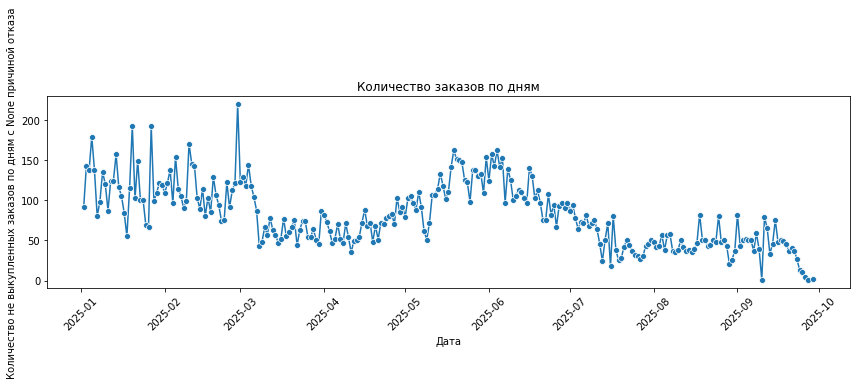

In [47]:
# строю график
a = df.query('ds_status == 0 and fail_reason.isna()')

plt.figure(figsize=(12,4))
sns.lineplot(data=a.groupby(a['created_at'].dt.date)['id'].count().reset_index(name='orders_count'), x='created_at',
    y='orders_count', marker='o')

plt.xticks(rotation=45)
plt.title('Количество заказов по дням')
plt.xlabel('Дата')
plt.ylabel('Количество не выкупленных заказов по дням с None причиной отказа')
plt.tight_layout()
plt.show()

In [48]:
# для этих заказов заменю Nan значения в fail_reason и reason_comes на "Неизвестно"
df.loc[(df['ds_status'] == 0) & (df['fail_reason'].isna()),['fail_reason', 'reason_comes']] = 'Неизвестно'

In [49]:
# также присвою новый тип доставки для этих заказов, т.к. изза Nan они могут потеряться в некоторых группировках
df.loc[df.query('ds_status == 0 and fail_reason == "Неизвестно" and type_delivery.isna()').index,'type_delivery'] = 'Тип неизвестен'

In [50]:
df.query('ds_status == 0 and fail_reason =="Неизвестно" and type_delivery =="Тип неизвестен"')

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
286,154969,2025-01-03,0,Тип неизвестен,МОСКВА,77.0,Неизвестно,Неизвестно,14600.00
353,154682,2025-01-03,0,Тип неизвестен,МОСКВА,77.0,Неизвестно,Неизвестно,14599.99
408,154839,2025-01-03,0,Тип неизвестен,МОСКВА,77.0,Неизвестно,Неизвестно,14989.96
434,154923,2025-01-03,0,Тип неизвестен,МОСКВА,77.0,Неизвестно,Неизвестно,14990.00
572,171470,2025-01-03,0,Тип неизвестен,МОСКОВСКАЯ ОБЛАСТЬ,50.0,Неизвестно,Неизвестно,14989.99
...,...,...,...,...,...,...,...,...,...
355253,159229,2025-09-26,0,Тип неизвестен,МОСКВА,77.0,Неизвестно,Неизвестно,12600.00
355452,157445,2025-09-26,0,Тип неизвестен,МОСКВА,77.0,Неизвестно,Неизвестно,6860.00
356191,262497,2025-09-27,0,Тип неизвестен,САНКТ-ПЕТЕРБУРГ,78.0,Неизвестно,Неизвестно,15789.99
358655,176631,2025-09-29,0,Тип неизвестен,МОСКОВСКАЯ ОБЛАСТЬ,50.0,Неизвестно,Неизвестно,0.00


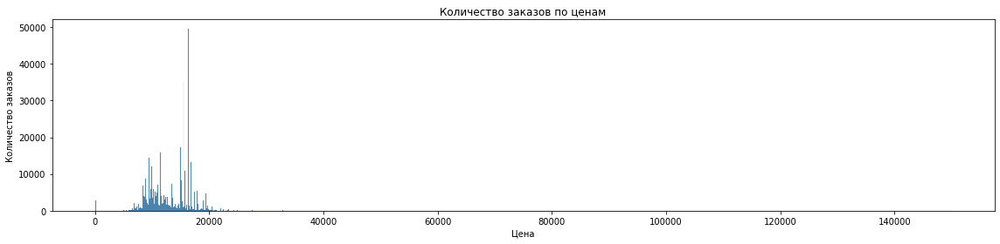

In [51]:
# построю гистограмму цен заказов чтобы увидеть какие-либо аномалии
plt.figure(figsize=(16,4))

sns.histplot(data=df, x='total_cost_for_recipient', bins=1000)

plt.title('Количество заказов по ценам')
plt.xlabel('Цена')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

In [52]:
# посмотрю заказы стоимостью больше 17000
df.query('total_cost_for_recipient > 17000 and total_cost_for_recipient < 19000')

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
65,35938,2025-01-02,0,courier,ВОЛГОГРАДСКАЯ ОБЛАСТЬ,34.0,Без объяснения,Клиент,18900.0
126,250540,2025-01-02,1,pvz,РОСТОВСКАЯ ОБЛАСТЬ,61.0,NaN,NaN,17576.0
153,264825,2025-01-02,0,courier,САНКТ-ПЕТЕРБУРГ,78.0,Неизвестно,Неизвестно,18900.0
403,212864,2025-01-03,0,courier,НОВОСИБИРСКАЯ ОБЛАСТЬ,54.0,Клиент передумал покупать,Клиент,18900.0
412,308209,2025-01-03,1,pvz,ТАТАРСТАН РЕСПУБЛИКА,16.0,NaN,NaN,18900.0
...,...,...,...,...,...,...,...,...,...
359646,391,2025-09-30,1,None,None,NaN,NaN,NaN,17890.0
359658,175244,2025-09-30,1,None,МОСКОВСКАЯ ОБЛАСТЬ,50.0,NaN,NaN,18000.0
359678,842,2025-09-30,1,None,None,NaN,NaN,NaN,17101.0
359679,841,2025-09-30,1,None,None,NaN,NaN,NaN,17101.0


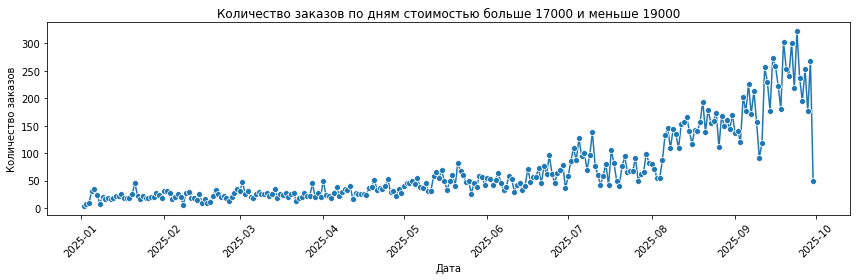

In [53]:
# строю график
a = df.query('total_cost_for_recipient > 17000 and total_cost_for_recipient < 19000')

plt.figure(figsize=(12,4))
sns.lineplot(data=a.groupby(a['created_at'].dt.date)['id'].count().reset_index(name='orders_count'), x='created_at',
    y='orders_count', marker='o')

plt.xticks(rotation=45)
plt.title('Количество заказов по дням стоимостью больше 17000 и меньше 19000')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Я проверил всё, что меня интересовало на данный момент, и перехожу непосредственно к исследованию*

**Перехожу непосредственно к исследованию и решению задачи**

*Сначала рассчитаю необходимые метрики*

In [54]:
# общая конверсия в выкуп
print('абсолютные значение:\n', df.ds_status.value_counts())
print('процентные значение:\n', df.ds_status.value_counts(normalize=True))

абсолютные значение:
 1    224690
0    135009
Name: ds_status, dtype: int64
процентные значение:
 1    0.624661
0    0.375339
Name: ds_status, dtype: float64


*37% невыкупленных заказов имеется в датасете*

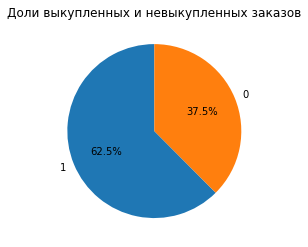

In [55]:
# построю пайчарт
a = df['ds_status'].value_counts()

plt.pie(a, labels=a.index, autopct='%1.1f%%', startangle=90)
plt.title('Доли выкупленных и невыкупленных заказов')
plt.show()

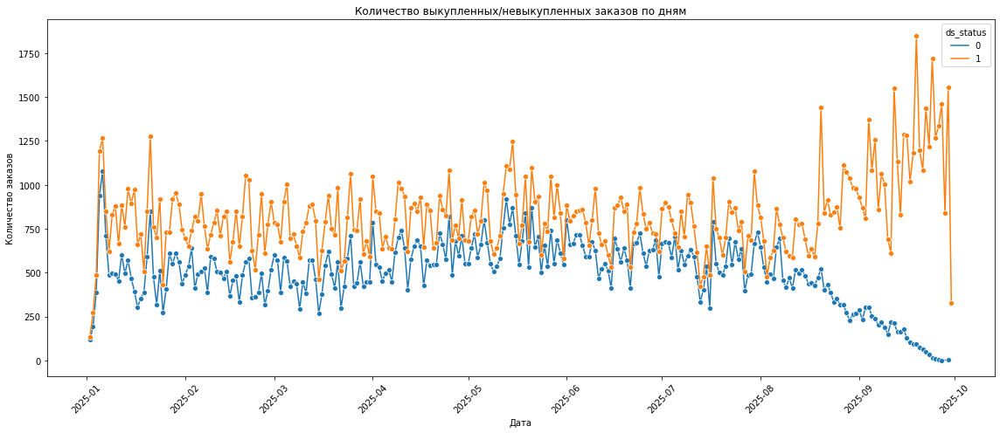

In [56]:
# построю график распределения по дням
plt.figure(figsize=(16,7))
sns.lineplot(data=df.groupby([df['created_at'].dt.date, 'ds_status'])['ds_status'].count().reset_index(name='count'),
    x='created_at', y='count', hue='ds_status', marker='o')

plt.xticks(rotation=45)
plt.title('Количество выкупленных/невыкупленных заказов по дням')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

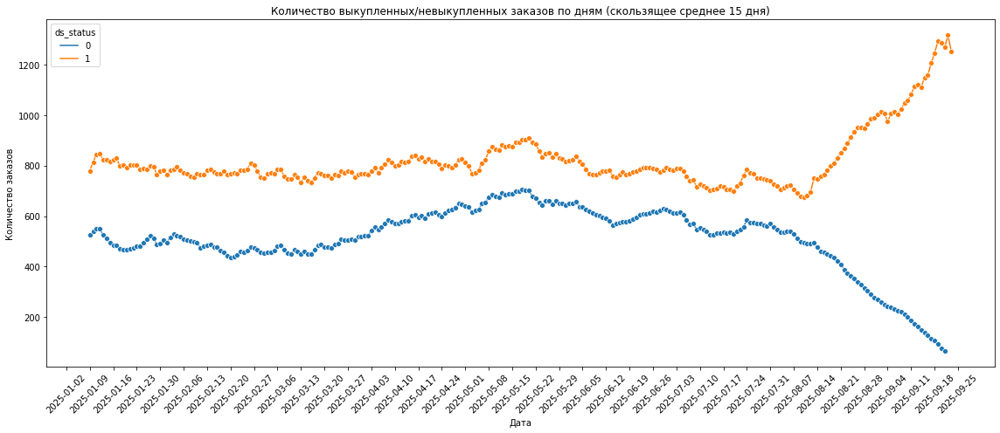

In [57]:
# из-за "заборчика" плохо видно тенденции. сделаю сглаживание по скользящему среднему за 15 дней (неделя до и после)

a = df.groupby([df['created_at'].dt.date, 'ds_status'])['ds_status'].count().reset_index(name='count')
a['rolling_15'] = a.groupby('ds_status')['count'].rolling(window=15, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_15', hue='ds_status', marker='o')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Количество выкупленных/невыкупленных заказов по дням (скользящее среднее 15 дня)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Действительно наблюдается тенденция на увеличение отказов от выкупа начиная с апреля*

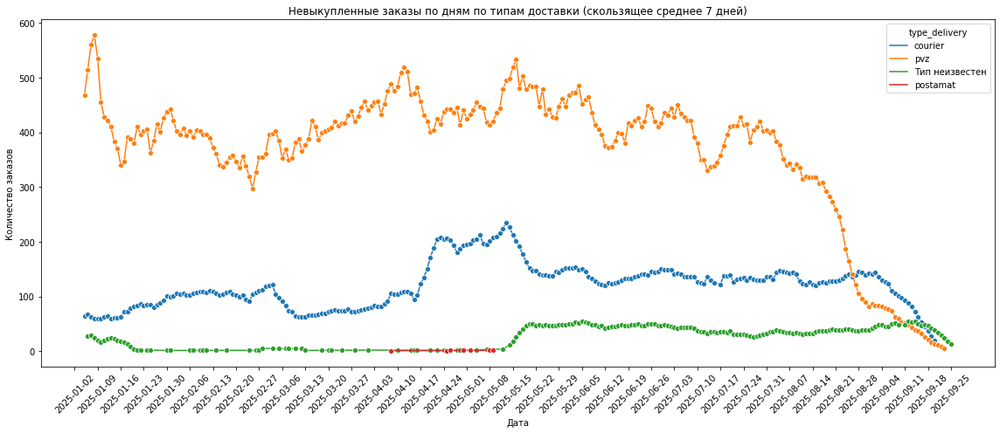

In [58]:
# построю график по типам причинам отказа

a = df.query('ds_status == 0')
a = a.groupby([a['created_at'].dt.date, 'type_delivery'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('type_delivery')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='type_delivery', marker='o')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по дням по типам доставки (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Тип доставки postamat имеет мизерное значение, поэтому я опущу его при дальнейших исследованиях*

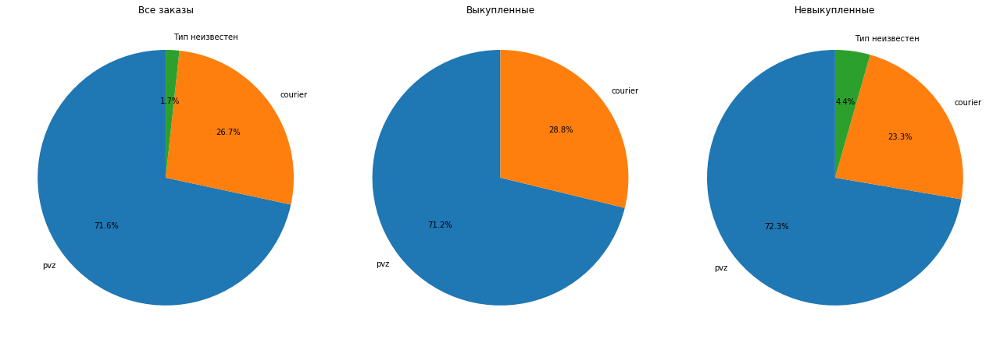

In [59]:
# построю пайчарты по долям типов доставки для всех заказов/только выкупленных/только невыкупленных
fig, axes = plt.subplots(1, 3, figsize=(18,6)) 

datasets = [
    df.query('type_delivery != "postamat"')['type_delivery'].value_counts(),             
    df.query('type_delivery != "postamat" and ds_status == 1')['type_delivery'].value_counts(),
    df.query('type_delivery != "postamat" and ds_status == 0')['type_delivery'].value_counts(),]

titles = ['Все заказы', 'Выкупленные', 'Невыкупленные',]

for ax, data, title in zip(axes, datasets, titles):
    ax.pie(data, labels=data.index, autopct='%1.1f%%', startangle=90)
    ax.set_title(title)

plt.tight_layout()
plt.show()

*По графикам видно, что статус заказа не зависит от типа доставки. Статистическую значимость этого наблюдения я проверю позже*

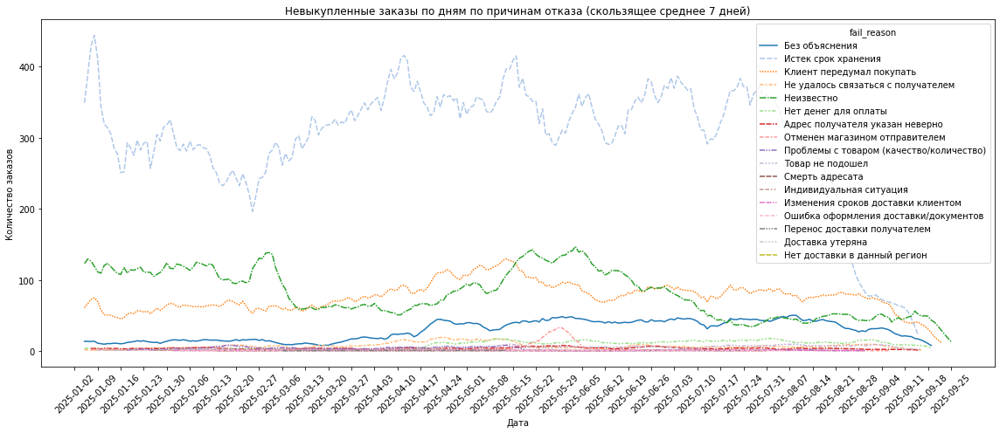

In [60]:
# построю график по типам доставки в отказных заказах

a = df.query('ds_status == 0')
a = a.groupby([a['created_at'].dt.date, 'fail_reason'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('fail_reason')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='fail_reason', style='fail_reason', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по дням по причинам отказа (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

In [61]:
# построю таблицу подсчет причин отказа
a = df.query('ds_status == 0')

result = (a.groupby('fail_reason')['id'].count().reset_index(name='count'))
result['percent'] = result['count'] / result['count'].sum() * 100
result = result.sort_values(by='count', ascending=False)
result

,fail_reason,count,percent
5,Истек срок хранения,76922,56.975461
8,Неизвестно,22018,16.308542
6,Клиент передумал покупать,20227,14.981964
1,Без объяснения,7632,5.652956
9,Нет денег для оплаты,2314,1.713960
7,Не удалось связаться с получателем,1946,1.441385
16,Товар не подошел,1249,0.925124
0,Адрес получателя указан неверно,1051,0.778467
14,Проблемы с товаром (качество/количество),671,0.497004
11,Отменен магазином отправителем,556,0.411824


*Плостность графика делает его плохо читаемым, поэтому я рассмотрю причины отказа для каждого типа доставки отдельно*

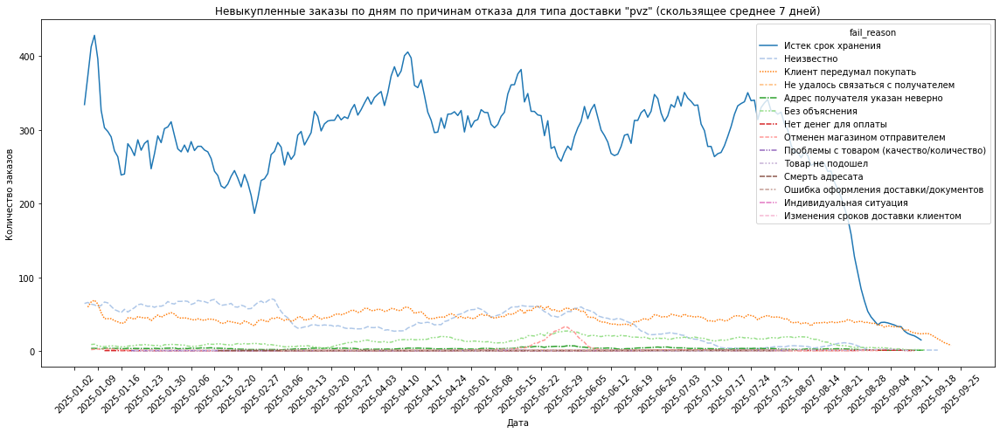

In [62]:
# построю график по причинам отказов только для pvz

a = df.query('ds_status == 0 and type_delivery == "pvz"')
a = a.groupby([a['created_at'].dt.date, 'fail_reason'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('fail_reason')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='fail_reason', style='fail_reason', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по дням по причинам отказа для типа доставки "pvz" (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

In [63]:
# построю таблицу подсчет причин отказа pvz
a = df.query('ds_status == 0 and type_delivery=="pvz"')

result = (a.groupby('fail_reason')['id'].count().reset_index(name='count'))
result['percent'] = result['count'] / result['count'].sum() * 100
result = result.sort_values(by='count', ascending=False)
result

,fail_reason,count,percent
4,Истек срок хранения,71010,72.856175
5,Клиент передумал покупать,11784,12.090370
7,Неизвестно,9412,9.656701
1,Без объяснения,3368,3.455564
0,Адрес получателя указан неверно,918,0.941867
9,Отменен магазином отправителем,524,0.537623
13,Товар не подошел,185,0.189810
6,Не удалось связаться с получателем,93,0.095418
8,Нет денег для оплаты,85,0.087210
12,Смерть адресата,33,0.033858


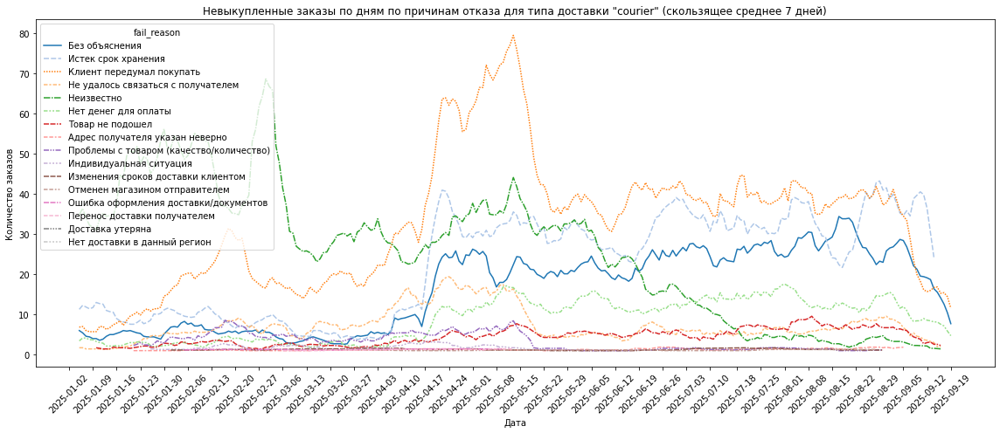

In [64]:
# построю график по причинам отказов только для courier

a = df.query('ds_status == 0 and type_delivery == "courier"')
a = a.groupby([a['created_at'].dt.date, 'fail_reason'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('fail_reason')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='fail_reason', style='fail_reason', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по дням по причинам отказа для типа доставки "courier" (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

In [65]:
# построю таблицу подсчет причин отказа courier
a = df.query('ds_status == 0 and type_delivery=="courier"')

result = (a.groupby('fail_reason')['id'].count().reset_index(name='count'))
result['percent'] = result['count'] / result['count'].sum() * 100
result = result.sort_values(by='count', ascending=False)
result

,fail_reason,count,percent
6,Клиент передумал покупать,8440,26.889257
8,Неизвестно,6655,21.202370
5,Истек срок хранения,5745,18.303173
1,Без объяснения,4232,13.482860
9,Нет денег для оплаты,2227,7.095068
7,Не удалось связаться с получателем,1853,5.903530
15,Товар не подошел,1064,3.389831
14,Проблемы с товаром (качество/количество),653,2.080413
4,Индивидуальная ситуация,190,0.605327
0,Адрес получателя указан неверно,133,0.423729


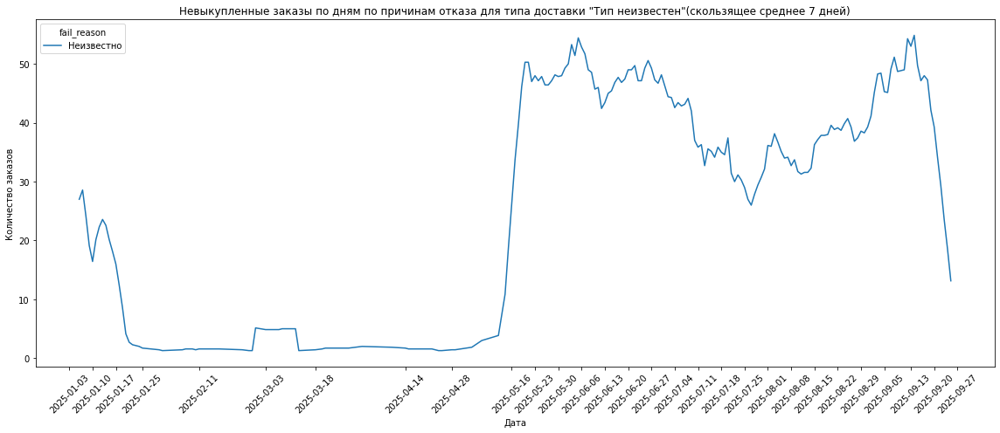

In [66]:
# построю график по причинам отказов только для Тип неизвестен

a = df.query('ds_status == 0 and type_delivery == "Тип неизвестен"')
a = a.groupby([a['created_at'].dt.date, 'fail_reason'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('fail_reason')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='fail_reason')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по дням по причинам отказа для типа доставки "Тип неизвестен"(скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Графики показывают следующую тенденцию: с начала марта начала возрастать причина "Истек срок хранения" в pvz и достигла пика в начале апреля. В дальшейнем она удериживалась на этом уровне (имея переодические пики и провалы) до начала августа, после чего пошла на спад. Для courier в начале апреля произошел резкий скачек причины "Клиент передумал покупать", этот скачек удерживался весь апрель, и резко опустился до определенного уровня в середине мая. Также параллельно с этим у courier в начале апреля выросли причины "Истек срок хранения" и "Без объяснения" и удерживались до сентября на этом уровне. Также именно в период подъема предыдущих причин резко подскочила причина "Неизвестно", она продержалась на этом уровне 2 месяца и начала спадать до нуля в июне. Тип доставки "Тип неизвестен" имел только единичные случаи до начала мая. Но с середины мая он сильно подскачил и продолжал удерживаться на этом уровне до сентября. Таким образом он заменил собой спады некоторых всплесков других типов которые начинали снижаться, и общая сумма оставалась на поддерживаемом уровне.* 

In [67]:
# построю сводную таблицу по месяцам, статусу выкупа и типу доставки. Посчитаю абсолютные значения и процентные
df_pivot = df.query('type_delivery != "postamat"').groupby([df['created_at'].dt.to_period('M'), 'type_delivery', 'ds_status']) \
    .size().unstack('type_delivery').fillna(0)

df_pivot = pd.concat({
    'count': df_pivot.astype(int),
    'percent': (df_pivot.div(df_pivot.groupby(level=0).transform('sum')) * 100).round(2)}, axis=1)

df_pivot = df_pivot.swaplevel(axis=1).sort_index(axis=1)
df_pivot = df_pivot.sort_index(level=['created_at', 'ds_status'], ascending=[True, False])

In [68]:
df_pivot

type_delivery        courier            pvz         Тип неизвестен        
                       count percent  count percent          count percent
created_at ds_status                                                      
2025-01    1            5915   72.78  16454   56.94              0     0.0
           0            2212   27.22  12443   43.06            387   100.0
2025-02    1            6957   70.02  14242   58.29              0     0.0
           0            2979   29.98  10189   41.71             16   100.0
2025-03    1            6351   72.64  16768   57.63              0     0.0
           0            2392   27.36  12330   42.37             43   100.0
2025-04    1            7470   64.60  16758   54.91              0     0.0
           0            4094   35.40  13759   45.09             17   100.0
2025-05    1            8802   61.23  16433   53.76              0     0.0
           0            5574   38.77  14136   46.24            758   100.0
2025-06    1            6943   62.72  14463   53.22              0     0.0
           0            4126   37.28  12713   46.78           1461   100.0
2025-07    1            6541   61.92  15247   54.96              0     0.0
           0            4023   38.08  12497   45.04           1099   100.0
2025-08    1            5559   57.17  17574   67.91              0     0.0
           0            4164   42.83   8305   32.09           1100   100.0
2025-09    1            7002   79.33  24166   95.67              0     0.0
           0            1824   20.67   1094    4.33           1070   100.0

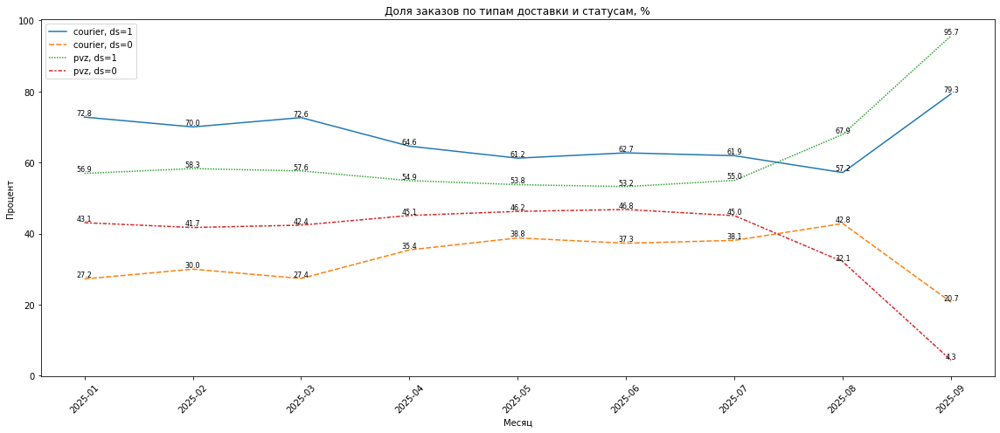

In [69]:
# построю график на основе таблицы для типов доставок pvz и courier и статусу доставки
df_plot = df_pivot.copy()

df_plot.columns = [f'{col[0]}_{col[1]}' for col in df_plot.columns]


df_plot = df_plot.reset_index()
df_plot['created_at'] = df_plot['created_at'].astype(str) 

df_long = df_plot.melt(id_vars=['created_at','ds_status'], value_vars=['courier_percent','pvz_percent'], var_name='type_delivery',
    value_name='percent')

df_long['legend'] = df_long['type_delivery'].str.replace('_percent','') + ', ds=' + df_long['ds_status'].astype(str)

plt.figure(figsize=(16,7))
a = sns.lineplot(data=df_long, x='created_at', y='percent', hue='legend', style='legend', palette='tab10')

for line in a.get_lines():
    x_data = line.get_xdata()
    y_data = line.get_ydata()
    for x, y in zip(x_data, y_data):
        a.text(x, y, f'{y:.1f}', fontsize=8, ha='center', va='bottom')

plt.xticks(rotation=45)
plt.title('Доля заказов по типам доставки и статусам, %')
plt.xlabel('Месяц')
plt.ylabel('Процент')
plt.legend(title='')
plt.tight_layout()
plt.show()

*По графику наглядно видно, что количество отказов по типу courier действительно резко подскочило с 27,4% в марте до 35,4% в апреле, и росло вплоть до августа. По типу pvz в апреле тоже произошел рост, но небольшой, с 42,4% в марте, до 45,1% в апреле. А еще в целом видно, что тип pvz в имеет больший процент отказов чем courier*

*Хотел бы обратить внимание какие резкие изменения происходят в сентябре. Связано это с тем, что все заказы имеют свой срок доставки и срок хранения, от нескольких дней до нескольких месяцев (например доставка через всю страну в труднодоступный регион). Соответственно с каждым днем к концу датасета растет неопределенность по статусу заказа, т.к. всё большее их число еще находится в процессе работы. Возрастает количество заказов которые еще находятся на сроке хранения*

*Хочу вернуться назад и рассмотреть ситуацию: я замечал, что некоторые заказы со статусом выкуплен имеют запись в причине отказа. Рассмотрю их влияение*

In [70]:
# выведу эти заказы
df.query('ds_status == 1 and fail_reason.notna()')

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
321,16592,2025-01-03,1,courier,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,Истек срок хранения,Клиент,14990.0
541,133286,2025-01-03,1,courier,КУРСКАЯ ОБЛАСТЬ,46.0,Не удалось связаться с получателем,Доставка,9490.0
617,33147,2025-01-03,1,courier,ВЛАДИМИРСКАЯ ОБЛАСТЬ,33.0,Без объяснения,Клиент,14990.0
777,230346,2025-01-04,1,pvz,ПЕРМСКИЙ КРАЙ,59.0,Клиент передумал покупать,Клиент,9500.0
1306,17859,2025-01-04,1,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,Истек срок хранения,Клиент,14990.0
...,...,...,...,...,...,...,...,...,...
356373,312937,2025-09-27,1,courier,ТВЕРСКАЯ ОБЛАСТЬ,69.0,Без объяснения,Клиент,9500.0
356487,172333,2025-09-27,1,courier,МОСКОВСКАЯ ОБЛАСТЬ,50.0,Клиент передумал покупать,Клиент,17490.0
357128,305952,2025-09-28,1,courier,ТАТАРСТАН РЕСПУБЛИКА,16.0,Без объяснения,Клиент,19500.0
357280,105704,2025-09-28,1,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,Без объяснения,Клиент,15000.0


In [71]:
# посчитаю процент этих заказов в датасете 
len(df.query('ds_status == 1 and fail_reason.notna()'))/len(df)*100

1.089800082847047

In [72]:
# посмотрю какие типы доставки есть в этих заказах
df.query('ds_status == 1 and fail_reason.notna()').type_delivery.unique()

array(['courier', 'pvz', None, 'postamat'], dtype=object)

*Моя гипотеза: возможно эти заказы со статусом выкупленные на самом деле невыкупленные (т.к. имеют причину отказа), и оказывают ложноположительное влияение на наше исследование. Рассмотрю их на графике*

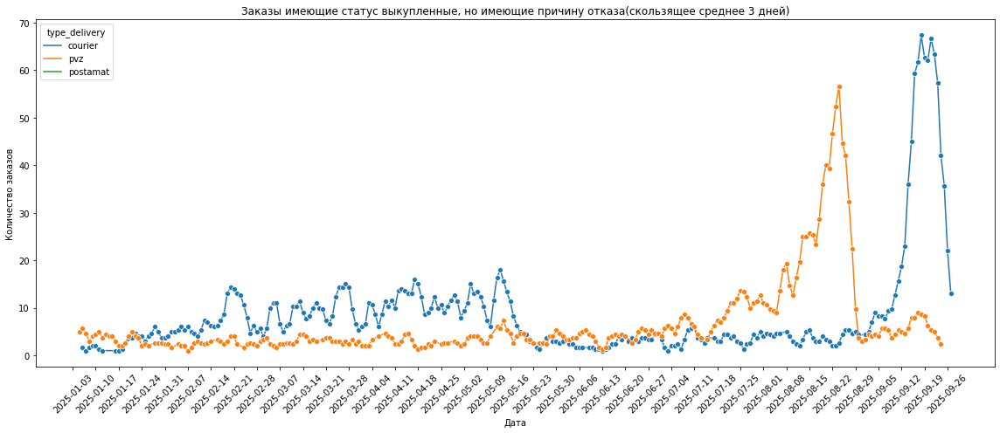

In [73]:
# построю график для этих заказов по датам в разрезе по типу доставки
a = df.query('ds_status == 1 and fail_reason.notna()')
a = a.groupby([a['created_at'].dt.date, 'type_delivery'])['id'].count().reset_index(name='orders_count')
a['rolling_3'] = a.groupby('type_delivery')['orders_count'].rolling(window=3, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_3', hue='type_delivery', marker='o')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Заказы имеющие статус выкупленные, но имеющие причину отказа(скользящее среднее 3 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*С учетом того что эти заказы составляют только 1% от датасета, и я не вижу какого-то большого подъема в период до апреля, я считаю, что эти заказы не оказывают влияения на подъем отказов начиная с апреля. Резкие пики в середине августа и сентября могут возникнуть как и из-за неопределенности статусов заказов ближе к концу датасете (об этом я писал выше), как и с попытками точечно решить возникшие проблемы.*

*Хочу развить предыдущую гипотезу, и рассмотреть новую: что если никакого снижения выкупа в апреле-августе не было, а на самом деле были ложно завышенны показатели выкупленных заказов в январе-марте*

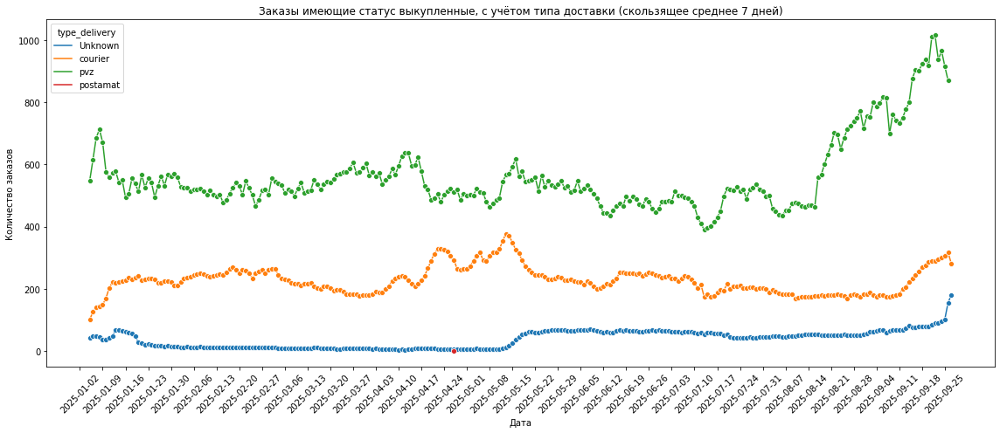

In [74]:
# строю график выкупленные заказы в разрезе по типам доставки
a = df.query('ds_status == 1').copy()
a['type_delivery'] = a['type_delivery'].fillna('Unknown') 
a = a.groupby([a['created_at'].dt.date, 'type_delivery'])['id'].count().reset_index(name='orders_count')

a['rolling_7'] = a.groupby('type_delivery')['orders_count'].rolling(window=7, center=True).mean(). \
                  reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='type_delivery', marker='o')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Заказы имеющие статус выкупленные, с учётом типа доставки (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Графики выкупленных заказов выглядят относительно линейно, и никаких завышенний относительно типов доставки в янавре-марте не имеют*

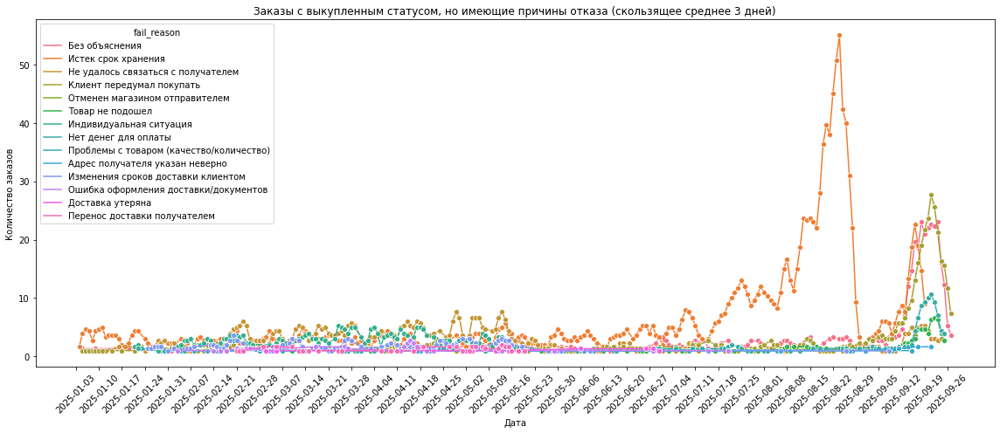

In [75]:
# рассмотрю график причин отказа в выкупленных зазаках
a = df.query('ds_status == 1').copy()
a['type_delivery'] = a['type_delivery'].fillna('Unknown')

a_grouped = a.groupby([a['created_at'].dt.date, 'fail_reason'])['id'].count().reset_index(name='orders_count')

a_grouped['rolling_3'] = a_grouped.groupby('fail_reason')['orders_count'].rolling(window=3, center=True).mean().reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a_grouped, x='created_at', y='rolling_3', hue='fail_reason', marker='o')

plt.xticks(a_grouped['created_at'].unique()[::7], rotation=45)
plt.title('Заказы с выкупленным статусом, но имеющие причины отказа (скользящее среднее 3 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Я хотел выявить определенные причины отказов в период январь-март, но по графикам я не вижу каких-либо аномалий в разрезах по типам доставки и причинам отказа захватывающий переход с январь-март на август-сентябрь*

*Возвращаюсь к первоначальной задаче, у меня была сводная таблица с конверсией по месяцам, теперь посчитаю по двум периодам январь-март, апрель-август и за переход с марта на апрель*

In [76]:
print('Конверсия в выкуп за январь-март:\n', df.query('created_at >= "2025-01-01" and created_at <= "2025-03-31"').ds_status.value_counts(normalize=True)*100)
print('Конверсия в выкуп за апрель-август:\n', df.query('created_at >= "2025-04-01" and created_at <= "2025-08-31"').ds_status.value_counts(normalize=True)*100)
print('Конверсия в выкуп за март:\n', df.query('created_at >= "2025-03-01" and created_at <= "2025-03-31"').ds_status.value_counts(normalize=True)*100)
print('Конверсия в выкуп за апрель:\n', df.query('created_at >= "2025-04-01" and created_at <= "2025-04-30"').ds_status.value_counts(normalize=True)*100)


Конверсия в выкуп за январь-март:
 1    61.313168
0    38.686832
Name: ds_status, dtype: float64
Конверсия в выкуп за апрель-август:
 1    58.168808
0    41.831192
Name: ds_status, dtype: float64
Конверсия в выкуп за март:
 1    61.280096
0    38.719904
Name: ds_status, dtype: float64
Конверсия в выкуп за апрель:
 1    57.72896
0    42.27104
Name: ds_status, dtype: float64


In [77]:
# разница конверсий отказов между периодами январь-март и апрель-август
(df.query('created_at >= "2025-04-01" and created_at <= "2025-08-31"').ds_status.value_counts(normalize=True)*100).get(0) - \
(df.query('created_at >= "2025-01-01" and created_at <= "2025-03-31"').ds_status.value_counts(normalize=True)*100).get(0)

3.144360209748548

In [78]:
# разница конверсий отказов между периодами январь-март и апрель-август
(df.query('created_at >= "2025-04-01" and created_at <= "2025-04-30"').ds_status.value_counts(normalize=True)*100).get(0) - \
(df.query('created_at >= "2025-03-01" and created_at <= "2025-03-31"').ds_status.value_counts(normalize=True)*100).get(0)

3.551136163609385

*Итак, наши главные конверсии для исследования. В апреле-августе количество отказов увеличилось на 3.14% по сравнению с январь-март. В переходе с марта на апрель количество отказов увеличилось на 3.55%*

*Приступаю к проверке статистической значимости этих конверсий. Нулевая гипотеза H0: разницы в количестве не выкупленных заказов между периодами январь-март и апрель-август нету. Я сделаю проверку для каждого типа доставки, и для этого буду использвовать z-test для сравнения двух конверсий*

In [79]:
# выполняю z-test для периодов январь-март и апрель-август
from statsmodels.stats.proportion import proportions_ztest

# фильтрую по периодам и выношу в отдельные таблицы
df_jan_mar = df.query('created_at >= "2025-01-01" and created_at <= "2025-03-31"').copy()
df_apr_aug = df.query('created_at >= "2025-04-01" and created_at <= "2025-08-31"').copy()

# заменяю None в типах доставки чтобы они учитывались в тесте
df_jan_mar['type_delivery'] = df_jan_mar['type_delivery'].fillna('Unknown')
df_apr_aug['type_delivery'] = df_apr_aug['type_delivery'].fillna('Unknown')

# вывожу типы доставок в переменную
delivery_types = pd.concat([df_jan_mar['type_delivery'], df_apr_aug['type_delivery']]).unique()

results = []

for i in delivery_types:
# фильтрую по типу доставки
    jan = df_jan_mar[df_jan_mar['type_delivery'] == i]
    apr = df_apr_aug[df_apr_aug['type_delivery'] == i]
    
# считаем количество отказов
    count = np.array([ (jan['ds_status']==0).sum(), (apr['ds_status']==0).sum() ])
    nobs = np.array([ len(jan), len(apr) ])
    
# z-тест для пропорций
    stat, pval = proportions_ztest(count, nobs)
    results.append({'type_delivery': i, 'z_stat': stat, 'p_value': pval})

pd.DataFrame(results)

,type_delivery,z_stat,p_value
0,courier,-28.517823,7.043217e-179
1,pvz,-3.991323,6.570565e-05
2,Unknown,20.888313,6.839270e-97
3,Тип неизвестен,NaN,NaN
4,postamat,-1.465755,1.427151e-01


*Вывод: для типов доставок courier и pvz p-value меньше 0.05, значит обнаружена статистическая значимость в разнице конверсий. Отклоняю нулевую гипотезу и принимаю альтернативную: разница конверсий в периоды январь-март и апрель-август есть. Показатели для остальных типов доставки нас слабо интересуют, т.к. они составляют мизерное количество во всем датасете*

In [80]:
# выполняю z-test для периодов март и апрель
from statsmodels.stats.proportion import proportions_ztest

# фильтрую по периодам и выношу в отдельные таблицы
df_jan_mar = df.query('created_at >= "2025-03-01" and created_at <= "2025-03-31"').copy()
df_apr_aug = df.query('created_at >= "2025-04-01" and created_at <= "2025-04-30"').copy()

# заменяю None в типах доставки чтобы они учитывались в тесте
df_jan_mar['type_delivery'] = df_jan_mar['type_delivery'].fillna('Unknown')
df_apr_aug['type_delivery'] = df_apr_aug['type_delivery'].fillna('Unknown')

# вывожу типы доставок в переменную
delivery_types = pd.concat([df_jan_mar['type_delivery'], df_apr_aug['type_delivery']]).unique()

results = []

for i in delivery_types:
# фильтрую по типу доставки
    jan = df_jan_mar[df_jan_mar['type_delivery'] == i]
    apr = df_apr_aug[df_apr_aug['type_delivery'] == i]
    
# считаем количество отказов
    count = np.array([ (jan['ds_status']==0).sum(), (apr['ds_status']==0).sum() ])
    nobs = np.array([ len(jan), len(apr) ])
    
# z-тест для пропорций
    stat, pval = proportions_ztest(count, nobs)
    results.append({'type_delivery': i, 'z_stat': stat, 'p_value': pval})

pd.DataFrame(results)

,type_delivery,z_stat,p_value
0,pvz,-6.672648,2.512279e-11
1,courier,-12.173572,4.298505e-34
2,Unknown,2.247071,2.463548e-02
3,Тип неизвестен,NaN,NaN
4,postamat,NaN,NaN


*Вывод: для типов доставок courier и pvz p-value меньше 0.05, значит обнаружена статистическая значимость в разнице конверсий. Отклоняю нулевую гипотезу и принимаю альтернативную: разница конверсий в периоды март и август есть. Показатели для остальных типов доставки нас слабо интересуют, т.к. они составляют мизерное количество во всем датасете*

*Я еще ниразу не изучил влияение регионов. Поскольку их большое количество (89) придется избавиться от малых значений*

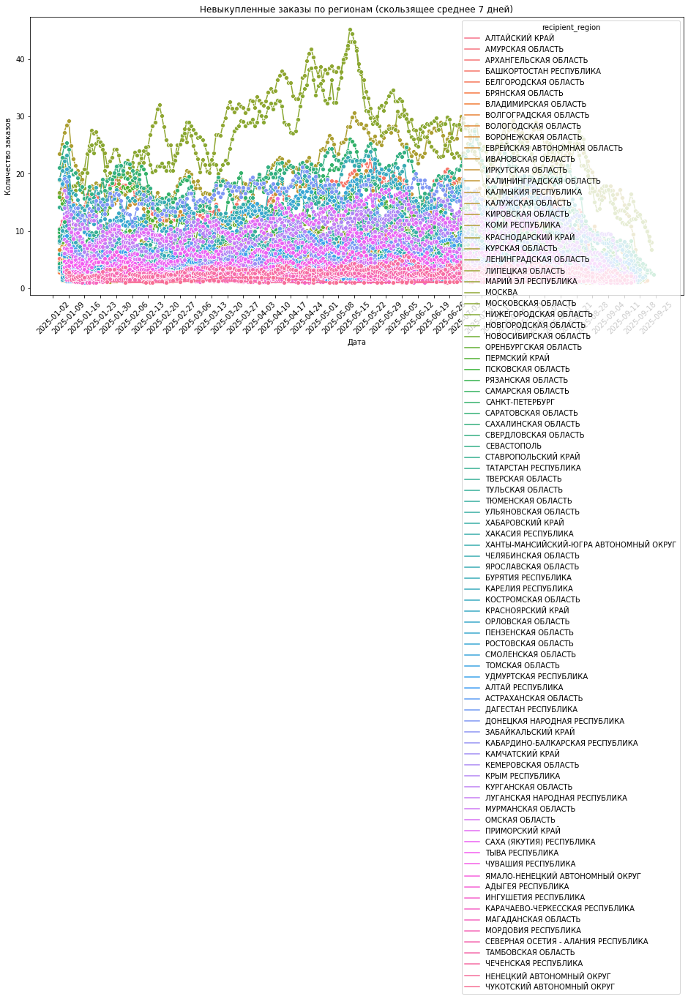

In [81]:
# построю график не выкупленных по регионам

a = df.query('ds_status == 0')
a = a.groupby([a['created_at'].dt.date, 'recipient_region'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('recipient_region')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='recipient_region', marker='o')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по регионам (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Предсказуемая каша, однако заметен ярко выраженный пик в апреле. Определю эти регионы. Их можно было определить вручную на графике с использованием интерактивной визуализации. Я сделаю это, но возможно эта визуализация не сохранит визуализацию. Библиотеки с интерактивной визуализацией имеют такую проблему, что не сохраняют компиляцию при выходе из блокнта*

In [82]:
# строю интерактивный график
import plotly.express as px

fig = px.line(a, x='created_at', y='rolling_7', color='recipient_region', hover_data=['recipient_region', 'orders_count'])
fig.show()

*Скорее всего у проверяющего не отобразился этот график. Я резюмирую: в топе графика следующие регионы: Москва, Московская область, Краснодарский край, Свердловская область, Санкт-Петербург*

In [83]:
# построю таблицу по регионам с топ-10 объемов не выкупленных заказов

a = df.query('ds_status == 0')

# считаю количество заказов по дате и региону
a_daily = a.groupby([a['created_at'].dt.date, 'recipient_region'])['id'].count().reset_index(name='orders_count')

# считаю сумму не выкупленных заказов по каждому региону
total_not_paid = a_daily.groupby('recipient_region')['orders_count'].sum().reset_index(name='total_not_paid')

# выношу топ-10
top_regions = total_not_paid.nlargest(10, 'total_not_paid')['recipient_region']

# создаю столбец с группировкой
total_not_paid['region_grouped'] = total_not_paid['recipient_region'].where(total_not_paid['recipient_region'].isin(top_regions), 'Other')

# теперь суммируем по grouped регионам
summary_table = total_not_paid.groupby('region_grouped')['total_not_paid'].sum().reset_index().sort_values('total_not_paid', ascending=False)

summary_table

,region_grouped,total_not_paid
0,Other,88926
6,МОСКВА,6714
7,МОСКОВСКАЯ ОБЛАСТЬ,6687
4,КРАСНОДАРСКИЙ КРАЙ,5599
9,СВЕРДЛОВСКАЯ ОБЛАСТЬ,4779
10,ЧЕЛЯБИНСКАЯ ОБЛАСТЬ,3906
8,САНКТ-ПЕТЕРБУРГ,3837
1,БАШКОРТОСТАН РЕСПУБЛИКА,3823
2,ДОНЕЦКАЯ НАРОДНАЯ РЕСПУБЛИКА,3745
3,ИРКУТСКАЯ ОБЛАСТЬ,3707


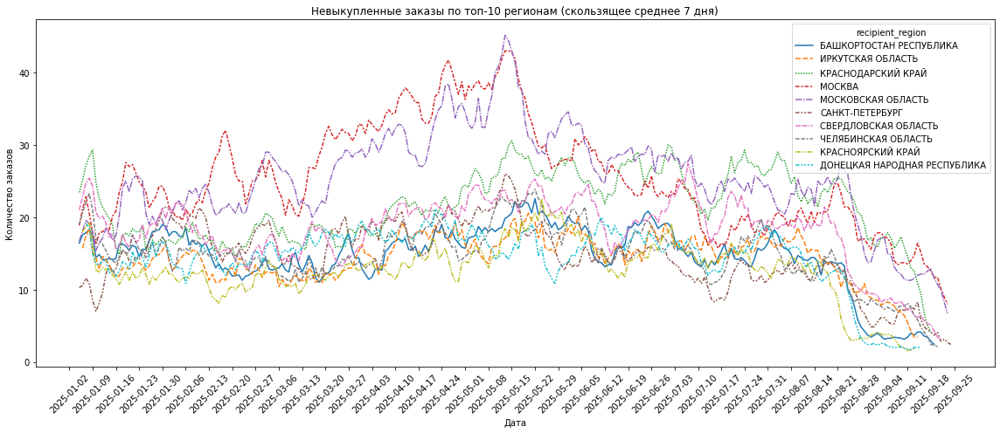

In [84]:
# Построю график только для этих регионов
a = df.query('ds_status == 0')

# считаю количество заказов по дате и региону
a = a.groupby([a['created_at'].dt.date, 'recipient_region'])['id'].count().reset_index(name='orders_count')

# сумма невыкупленных заказов по каждому региону
total_not_paid = a.groupby('recipient_region')['orders_count'].sum().reset_index(name='total_not_paid')

# выбираю топ-10 регионов по объему заказов
top_regions = total_not_paid.nlargest(10, 'total_not_paid')['recipient_region']

# фильтрую только эти регионы
a_top = a[a['recipient_region'].isin(top_regions)]

# скользящее среднее
a_top['rolling_7'] = a_top.groupby('recipient_region')['orders_count'].rolling(window=7, center=True).mean().reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a_top, x='created_at', y='rolling_7', hue='recipient_region', style='recipient_region')

plt.xticks(a_top['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по топ-10 регионам (скользящее среднее 7 дня)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*На графике виден яркий скачек с середины марта до середины мая для регионов Москва и Московская область*

In [85]:
# расчитаю конверсию невыкупленных для регионов Москва и Московская область в разнице периодов январь-март и апрель-май

a = df.query('ds_status == 0')

regions_of_interest = ['МОСКВА', 'МОСКОВСКАЯ ОБЛАСТЬ']

# задаем периоды
periods = {'Jan-Feb': ('2025-01-01', '2025-02-28'),
    'Mar-May': ('2025-03-01', '2025-05-31')}

results = []

for name, (start, end) in periods.items():
    period_df = a.query(f'created_at >= "{start}" and created_at <= "{end}"')
    
    total_orders = len(period_df) 
    
    for region in regions_of_interest:
        region_orders = period_df[period_df['recipient_region'] == region].shape[0]
        percent = region_orders / total_orders * 100 if total_orders > 0 else 0
        results.append({
            'period': name,
            'region': region,
            'region_orders': region_orders,
            'total_orders': total_orders,
            'percent': percent })

pd.DataFrame(results)

,period,region,region_orders,total_orders,percent
0,Jan-Feb,МОСКВА,1331,28375,4.690749
1,Jan-Feb,МОСКОВСКАЯ ОБЛАСТЬ,1212,28375,4.271366
2,Mar-May,МОСКВА,3018,53137,5.679658
3,Mar-May,МОСКОВСКАЯ ОБЛАСТЬ,2823,53137,5.312682


*Проведу проверку стат значимости для регионов Москва и Московская область, будут использовать использвовать z-test для сравнения двух конверсий. Нулевая гипотеза H0: конверсии для Москвы и Московской области за периоды январь-февраль и март-май не отличаются*

In [86]:
# задаю регионы и периоды
regions = ['МОСКВА', 'МОСКОВСКАЯ ОБЛАСТЬ']
periods = {
    'Jan-Feb': ('2025-01-01', '2025-02-28'),
    'Mar-May': ('2025-03-01', '2025-05-31')}

results = []

for region in regions:
# фильтрую заказы по региону и периоду
    df_region = df[df['recipient_region'] == region]
    
    janfeb = df_region.query(f'ds_status == 0 and created_at >= "{periods["Jan-Feb"][0]}" and created_at <= "{periods["Jan-Feb"][1]}"')
    marmay = df_region.query(f'ds_status == 0 and created_at >= "{periods["Mar-May"][0]}" and created_at <= "{periods["Mar-May"][1]}"')
    
# считаю количество невыкупленных и общее количество заказов
    count = [len(janfeb), len(marmay)]
    nobs = [len(df_region.query(f'created_at >= "{periods["Jan-Feb"][0]}" and created_at <= "{periods["Jan-Feb"][1]}"')),
            len(df_region.query(f'created_at >= "{periods["Mar-May"][0]}" and created_at <= "{periods["Mar-May"][1]}"'))]
    
# z-тест
    stat, pval = proportions_ztest(count, nobs)
    
    results.append({
        'region': region,
        'z_stat': stat,
        'p_value': pval,
        'percent_janfeb': count[0]/nobs[0]*100 if nobs[0]>0 else 0,
        'percent_marmay': count[1]/nobs[1]*100 if nobs[1]>0 else 0
    })

pd.DataFrame(results)

,region,z_stat,p_value,percent_janfeb,percent_marmay
0,МОСКВА,-3.256147,1.129351e-03,38.590896,41.905026
1,МОСКОВСКАЯ ОБЛАСТЬ,-15.778756,4.356882e-56,14.642987,23.667002


*Вывод: p-value меньше 0.05. Скачек невыкупленных заказов начавшийся в марте для регионов Москва и Московская область статистически значимый.* 

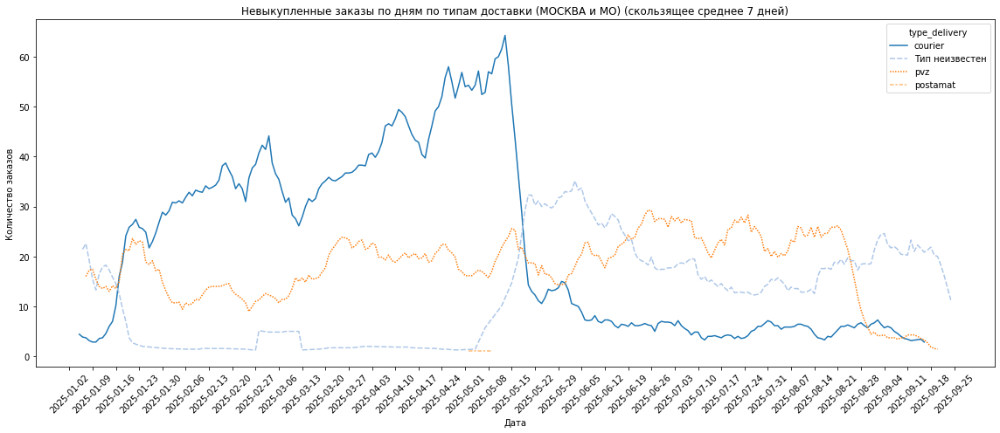

In [87]:
# посмотрю разрезы по типам доставок в регионах Москва и Московская область
a = df.query('ds_status == 0 and recipient_region in ["МОСКВА", "МОСКОВСКАЯ ОБЛАСТЬ"]')

a = a.groupby([a['created_at'].dt.date, 'type_delivery'])['id'].count().reset_index(name='orders_count')

a['rolling_7'] = a.groupby('type_delivery')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='type_delivery', style='type_delivery', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по дням по типам доставки (МОСКВА и МО) (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*По графику видно, что в Москве и МО наблюдался подъем отказов по типу courier. Подъем начался в середине январа и достиг пика в середине мая, а потом резго опустился. Также видно, что в момент спада типа courier из нуля вырос типа "Тип неизвестен". Изучу причины этих двух типов отдельно*

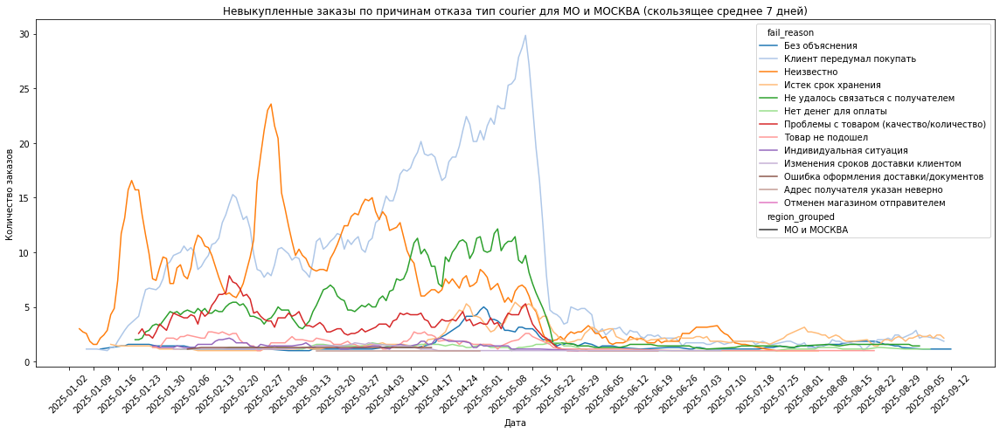

In [88]:
# построю график причин отказов только для courier в регионах Москва и МО
a = df.query('ds_status == 0 and type_delivery == "courier" and recipient_region in ["МОСКВА", "МОСКОВСКАЯ ОБЛАСТЬ"]')

a['region_grouped'] = 'МО и МОСКВА'

a = a.groupby([a['created_at'].dt.date, 'fail_reason', 'region_grouped'])['id'].count().reset_index(name='orders_count')

a['rolling_7'] = a.groupby(['fail_reason', 'region_grouped'])['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=[0,1], drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='fail_reason', style='region_grouped', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по причинам отказа тип courier для МО и МОСКВА (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Для типа courier пик отзаков пришелся на начало мая. Главная причина "Клиент передумал покупать"*

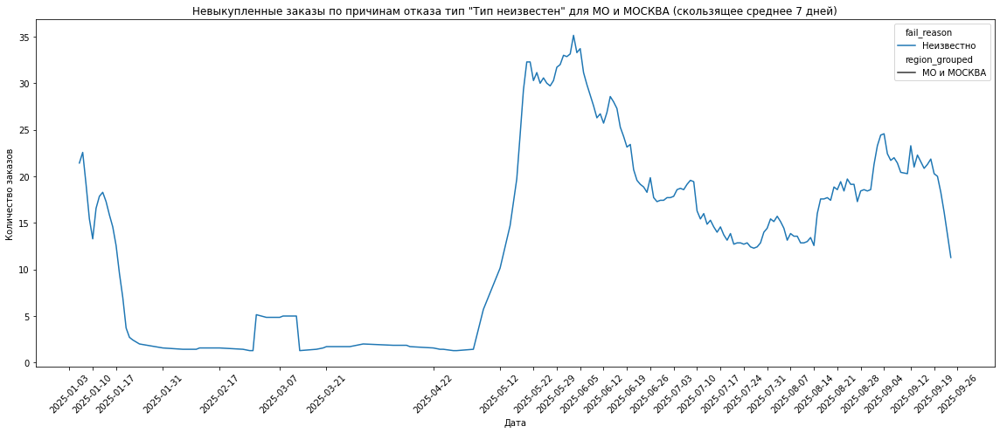

In [89]:
# построю график причин отказов только для Тип неизвестен в регионах Москва и МО

a = df.query('ds_status == 0 and type_delivery == "Тип неизвестен" and recipient_region in ["МОСКВА", "МОСКОВСКАЯ ОБЛАСТЬ"]')

a['region_grouped'] = 'МО и МОСКВА'

a = a.groupby([a['created_at'].dt.date, 'fail_reason', 'region_grouped'])['id'].count().reset_index(name='orders_count')

a['rolling_7'] = a.groupby(['fail_reason', 'region_grouped'])['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=[0,1], drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='fail_reason', style='region_grouped', palette='tab20')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по причинам отказа тип "Тип неизвестен" для МО и МОСКВА (скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*В тоже самое время по типу доставки "Тип неизвестен" резко возросло число отказов по причине "Неизвестно". Я могу только предложиться что за этим неизвестным типом кроются те же courier и "Клиент передумал покупать". Возможно в начале мая произошел сбой, и после этого они стали записываться как None*

Я немного ошибся в предыдущих блоках: на самом деле нас должен интересовать процент невыкупа по регионам, а не абсолютные значение. Не буду удалять предыдущие блоки т.к. мне понадобятся все эти формулы. Пересчитаю регионы в новой таблице уже по процентам

In [90]:
# таблица по процентам невыкупа по регионам
# общее количество заказов по регионам
total_orders = df.groupby('recipient_region')['id'].count().reset_index(name='total_orders')

# количество невыкупленных заказов по регионам
not_paid = df.query('ds_status == 0').groupby('recipient_region')['id'].count().reset_index(name='not_paid')

# обединяю
a = total_orders.merge(not_paid, on='recipient_region', how='left')

a['not_paid'] = a['not_paid'].fillna(0)
a['percent_not_paid'] = a['not_paid'] / a['total_orders'] * 100

# топ-10
top_regions = a.nlargest(10, 'percent_not_paid')['recipient_region']

# не топ-10 в other
a['region_grouped'] = a['recipient_region'].where(a['recipient_region'].isin(top_regions), 'Other')

# финальная агрегация 
summary_table = (a.groupby('region_grouped').agg({'not_paid': 'sum','total_orders': 'sum'}).reset_index())
summary_table['percent_not_paid'] = summary_table['not_paid'] / summary_table['total_orders'] * 100
summary_table = summary_table.sort_values(by='percent_not_paid', ascending=False)
summary_table

,region_grouped,not_paid,total_orders,percent_not_paid
9,ТЫВА РЕСПУБЛИКА,452.0,759,59.552042
4,ИНГУШЕТИЯ РЕСПУБЛИКА,123.0,211,58.293839
10,ЧЕЧЕНСКАЯ РЕСПУБЛИКА,718.0,1416,50.706215
5,КАБАРДИНО-БАЛКАРСКАЯ РЕСПУБЛИКА,657.0,1322,49.697428
6,КАЛМЫКИЯ РЕСПУБЛИКА,226.0,455,49.670330
7,КАРАЧАЕВО-ЧЕРКЕССКАЯ РЕСПУБЛИКА,375.0,773,48.512290
8,СЕВЕРНАЯ ОСЕТИЯ - АЛАНИЯ РЕСПУБЛИКА,553.0,1144,48.339161
1,АЛТАЙ РЕСПУБЛИКА,336.0,701,47.931526
3,ДАГЕСТАН РЕСПУБЛИКА,1624.0,3390,47.905605
2,АСТРАХАНСКАЯ ОБЛАСТЬ,794.0,1733,45.816503


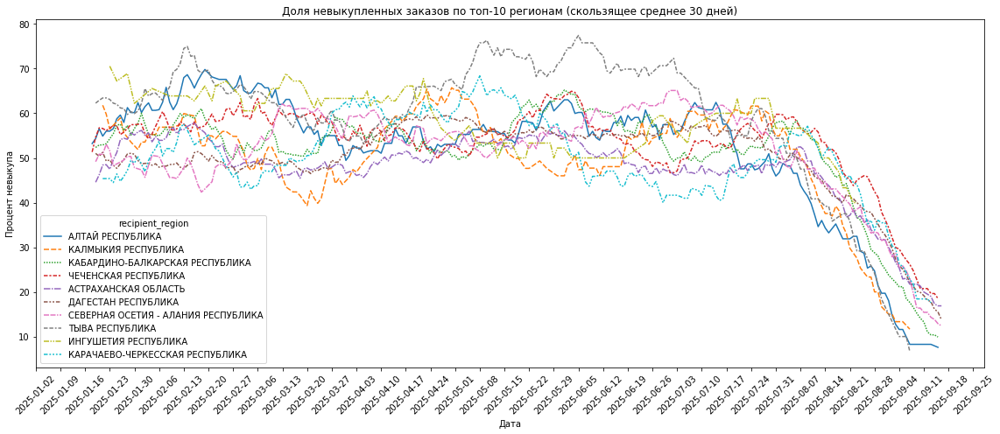

In [91]:
# Построю график только для этих регионов
# считаю общее количество заказов по дате и региону
total_daily = df.groupby([df['created_at'].dt.date, 'recipient_region'])['id'].count().reset_index(name='total_orders')

# считаю невыкупленные
not_paid_daily = df.query('ds_status == 0').groupby([df['created_at'].dt.date, 'recipient_region'])['id'].count().reset_index(name='not_paid')

# объединяю и считаю процент
a = total_daily.merge(not_paid_daily, on=['created_at', 'recipient_region'], how='left')
a['not_paid'] = a['not_paid'].fillna(0)

a['percent_not_paid'] = a['not_paid'] / a['total_orders'] * 100

# считаем общий процент по региону (для выбора топ-10)
region_percent = (a.groupby('recipient_region').agg({'not_paid': 'sum', 'total_orders': 'sum'}).reset_index())
region_percent['percent_not_paid'] = region_percent['not_paid'] / region_percent['total_orders'] * 100

# топ-10 по проценту
top_regions = region_percent.nlargest(10, 'percent_not_paid')['recipient_region']
a_top = a[a['recipient_region'].isin(top_regions)]

# скользящее среднее 
a_top['rolling_30'] = a_top.groupby('recipient_region')['percent_not_paid'].rolling(window=30, center=True).mean().reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a_top, x='created_at', y='rolling_30', hue='recipient_region', style='recipient_region')

plt.xticks(a_top['created_at'].unique()[::7], rotation=45)
plt.title('Доля невыкупленных заказов по топ-10 регионам (скользящее среднее 30 дней)')
plt.xlabel('Дата')
plt.ylabel('Процент невыкупа')
plt.tight_layout()
plt.show()

*Честно говоря, после обнаружения этой ошибки у меня голова пошла кругом. Их изучения я предпочту сделать с помощью визуализация дашборда. Отойду от регионов.*

*Я хочу изучить сегментацию которую я сам присвоил причинам отказам. Это не может считаться каким то значимым показателем, т.к. некоторые присвоения сегментов являются чисто субъективными. Например причину отказа "Ошибка оформления доставки/документов" я отнес к сегменту "Доставка", но я не знаю кто занимается оформлением документов, на каждый заказ это может быть любой из "Магазин"-"Доставка"-"Клиент". А причину "Без объяснения" я отнес к сегменту "Клиент", хотя не имеется никакой информации на этот счет. Мне просто нужно было определить эту причину в какой-то сегмент*

In [92]:
# еще раз выведу таблицу с уникальными причинами и сегментацией 
df_reasons['Sheet2']

,edited_reason,reason_comes
0,Клиент передумал покупать,Клиент
1,Истек срок хранения,Клиент
2,Без объяснения,Клиент
3,Нет денег для оплаты,Клиент
4,Не удалось связаться с получателем,Доставка
5,Товар не подошел,Клиент
6,Ошибка оформления доставки/документов,Доставка
7,Проблемы с товаром (качество/количество),Магазин
8,Изменения сроков доставки клиентом,Клиент
9,Перенос доставки получателем,Клиент


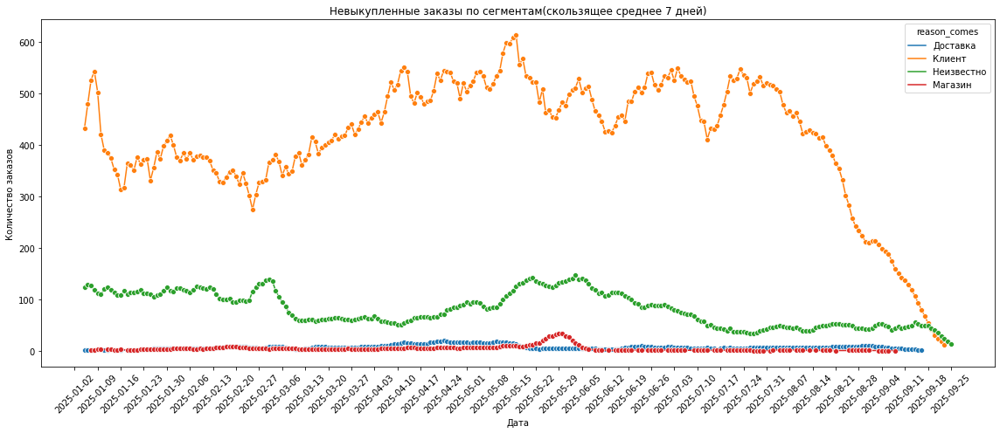

In [93]:
# построю график по сегментам
a = df.query('ds_status == 0')
a = a.groupby([a['created_at'].dt.date, 'reason_comes'])['id'].count().reset_index(name='orders_count')
a['rolling_7'] = a.groupby('reason_comes')['orders_count'].rolling(window=7, center=True).mean(). \
                reset_index(level=0, drop=True)

plt.figure(figsize=(16,7))
sns.lineplot(data=a, x='created_at', y='rolling_7', hue='reason_comes', marker='o')

plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Невыкупленные заказы по сегментам(скользящее среднее 7 дней)')
plt.xlabel('Дата')
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

*Хоть присвоение сегментов с моей стороны носит чисто субъективный характер, на графике виден ярко выраженный подъем начиная с апреля именно со стороны сегмента Клиентов*

In [94]:
# расчитаю конверсию для сегментов за периоды январь-март и апрель-август
print('Конверсия по отказам за январь-март:\n', df.query('ds_status == 0 and created_at >= "2025-01-01" and created_at <= "2025-03-31"').reason_comes.value_counts(normalize=True)*100)
print('Конверсия по отказам за апрель-август:\n', df.query('ds_status == 0 and created_at >= "2025-04-01" and created_at <= "2025-08-31"').reason_comes.value_counts(normalize=True)*100)


Конверсия по отказам за январь-март:
 Клиент        77.163183
Неизвестно    20.816147
Доставка       1.126199
Магазин        0.894471
Name: reason_comes, dtype: float64
Конверсия по отказам за апрель-август:
 Клиент        83.870894
Неизвестно    13.554731
Доставка       1.627478
Магазин        0.946896
Name: reason_comes, dtype: float64


In [95]:
# разница конверсий отказов между периодами январь-март и апрель-август для Клиентов
(df.query('ds_status == 0 and created_at >= "2025-04-01" and created_at <= "2025-08-31"').reason_comes.value_counts(normalize=True)*100).get(0) - \
(df.query('ds_status == 0 and created_at >= "2025-01-01" and created_at <= "2025-03-31"').reason_comes.value_counts(normalize=True)*100).get(0)

6.707711297389963

*Видно, что количество не выкупленных заказов в сегменте Клиент выросло на 6.7% с периода январь-март до апрель-август. Проверять стат значимость этих изменений я не буду, по причине, как я говорил ранее, субъективного распределения по сегментам* 

---

*На этом я хочу остановить свое исследование. Я считаю, что дальнейшие углубления и изучения возможных причин отказа от выкупа заказов будут иметь мизерный эффект. Я провел достаточно интересующих меня расчетов и исследования. Я изучил срезы по причинам отказа, типам доставки, регионом, проверил цены на предмет аномалий, обнаружил битые заказы и заказы с ошибочными данными. Из всего этого я сформировал для себя общую картинку и на основе этого хочу перейти к финальным выводам*

In [96]:
# еще раз взглянем на структуру самого датасета
df.head()

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient
0,285810,2025-01-02,1,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,NaN,NaN,14990.0
1,19474,2025-01-02,0,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,Неизвестно,Неизвестно,11400.0
2,286460,2025-01-02,0,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,Неизвестно,Неизвестно,16900.0
3,256912,2025-01-02,1,courier,САМАРСКАЯ ОБЛАСТЬ,63.0,NaN,NaN,12230.0
4,103820,2025-01-02,0,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,Истек срок хранения,Клиент,10030.0


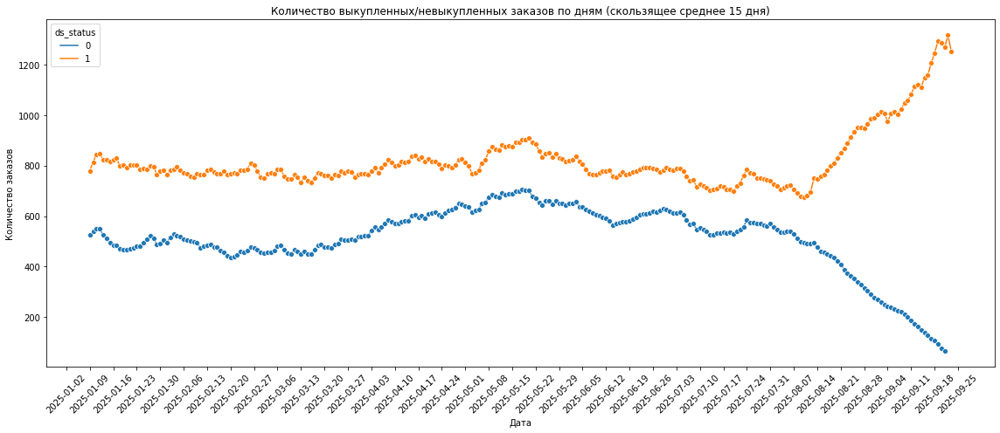

In [97]:
# и главный график количества отказов по дням
a = df.groupby([df['created_at'].dt.date, 'ds_status'])['ds_status'].count().reset_index(name='count')
a['rolling_15'] = a.groupby('ds_status')['count'].rolling(window=15, center=True).mean().reset_index(level=0, drop=True)
plt.figure(figsize=(16,7)) 
sns.lineplot(data=a, x='created_at', y='rolling_15', hue='ds_status', marker='o')
plt.xticks(a['created_at'].unique()[::7], rotation=45)
plt.title('Количество выкупленных/невыкупленных заказов по дням (скользящее среднее 15 дня)')
plt.xlabel('Дата') 
plt.ylabel('Количество заказов')
plt.tight_layout()
plt.show()

---

**Вывод по заданию: снижение выкупа заказов в период апрель–август обусловлено совокупным влиянием нескольких факторов. Анализ ключевых разрезов показал, что вклад этих факторов варьировался во времени, формируя устойчиво повышенный уровень отказов. Доминирующий и единственный фактор, объясняющий наблюдаемую динамику в полном объёме, не выявлен.**

Я рассматривал датасет в следующих разрезах:   
    1. Временные периоды, основные из которых сравнение январь-март и апрель-август, а также дополнительные периода  
    2. Статус заказа, выкуплен=1, не выкулен=2  
    3. Тип доставки: courier, pvz, postmat, Unknown, None    
    4. Регионы: 89 уникальных значений  
    5. Причины отказа: 16 уникальных значений. Значения обобщены из изначальных 470 причин отказов  
    6. Сегменты этапа отказов: Магазин, Доставка, Клиент  

Результаты я оформлю в презентации, а здесь просто сухо перечислю эти факторы:  


1280 заказов с неизвестными регионами, они составляют 0,36% датасета, из них в половине неизвестен тип доставки (672), из них 1272 выкупленные. Их период приходится на январь-март и июнь-август

17177 заказов имеют неизвестный тип доставки, они составляют 4,78% датасета. Практически все они находятся в периоде с начала мая до конца сентября. 35.74% из них имеют статус не выкупленные (6139 шт), 64.25% выкупленные (11038 шт)

В датасете имелось 470 уникальных причин заказов, я обобщил и объеденил их до 16 уникальных значений. Так же эти 16 значений я разбил на сегменты по этапу доставки (Магазин-Служба Доставки-Клиент)

В датасете имеется 3920 заказов имеющих статус выкупленных, но при этом имеющих причину отказа. Эти заказазы составляют 1.08% от датасета

В датасете имеется 22018 заказов имеющих статус не выкупленных, но при этом не имеют заполненной графу причины отказа. Эти заказы составляю 6.12% датасета. По времени они меют подъем в январе-феврале и мае-июне

Больше всего заказов имеют ценник в районе 17000-19000. Количество заказов с таким ценником планомерно увеличивалось на протяжении всего периода и достигло пика в августе

В датасете имеется 359699 уникальных заказов. 224690 выкуплены (62.45%), 135009 не выкупленны (37.53%). Среди всех заказов 71.6% составляют pvz, 26.7% courier, 1.7% неизвестный тип доставки. Тип postamat имеет единичные заказы поэтому я исключил его из расчетов. Выкупленные заказы 71.2% pvz, 28,8% curier. Не выкупленные. 72.3% pvz, curier 23.3%, 4,4% неизвестный тип. Доли близки между собой

Основными причинами невыкупа являются: Истек срок храненния (56.97%, 76922 шт), Неизвестно (16.03%, 22018 шт), Клиент передумал покупать (14.98%, 20227), Без объяснения (5.65%, 7632шт). Отдельно для pvz: Истек срок хранения (72%, 71010), Клиент передумал покупать (12.09%, 11784), Неивестно (9.65%, 9412 шт). Отдельно для courier: Клиент передумал покупать 	(8440 шт, 26.88%), Неизвестно (6655 шт, 21.20%), Истек срок хранения (5745 шт, 18.30%), Без объяснения 	(4232 шт, 	13.48%)

Конверсии за январь-март, выкупленные 61.31%, не выкупленные 38.68%. 
Конверсии за апрель-август, выкупленные 58.16%, не выкупленные 41.83%
Невыкуп увеличился на 3.14%
Конверсии за март, выкупленные 61.28%, не выкупленные 38.71%
Конверсии за апрель, выкулпенные 57.72%, не выкупленные 42.27%
Невыкуп увеличился на 3.55%

По регионам, больше всего невыкупленных заказов в Москве 6715, Московской области 6687, Краснодарский край 5599, Свердловская область 4779, Челябинская Область 3906 

По процентам невыкупленных заказов:  в топе Республика Тыва (59.55%, 452шт), Ингушетия (58.29%, 123шт), Чеченская республика (50.70%, 718шт), Кабардино-Балкария (49.69%, 657шт), Калмыкия (49.67, 226) 

По сегментам: невыкуп со стороны клиентов было 77.16% в январь-март, стало 83.87% апрель-август, разница 6.70


---

*Технический мердж для дашборда. Для рисования регионов я буду использвовать таблицу с полигонами от яндекса, в которой номера регионов не совпадают с официальными. Чтобы не утяжелять расчеты, я создам новый столбец для мерджа в этом датасете.*

In [98]:
reg_soyz = pd.read_csv("reg_soyz.csv")

In [99]:
reg_soyz.dtypes

recipient_region            object
recipient_region_number    float64
yandex_id                  float64
dtype: object

In [100]:
reg_soyz['yandex_id'] = reg_soyz['yandex_id'].astype('Int64')

In [101]:
reg_soyz

,recipient_region,recipient_region_number,yandex_id
0,АДЫГЕЯ РЕСПУБЛИКА,1.0,42
1,АЛТАЙ РЕСПУБЛИКА,4.0,43
2,АЛТАЙСКИЙ КРАЙ,22.0,1
3,АМУРСКАЯ ОБЛАСТЬ,28.0,2
4,АРХАНГЕЛЬСКАЯ ОБЛАСТЬ,29.0,3
...,...,...,...
83,ЧЕЧЕНСКАЯ РЕСПУБЛИКА,20.0,62
84,ЧУВАШИЯ РЕСПУБЛИКА,21.0,63
85,ЧУКОТСКИЙ АВТОНОМНЫЙ ОКРУГ,87.0,83
86,ЯМАЛО-НЕНЕЦКИЙ АВТОНОМНЫЙ ОКРУГ,89.0,84


In [102]:
df = df.merge(reg_soyz[['recipient_region', 'yandex_id']], on='recipient_region', how='left')

In [103]:
df

,id,created_at,ds_status,type_delivery,recipient_region,recipient_region_number,fail_reason,reason_comes,total_cost_for_recipient,yandex_id
0,285810,2025-01-02,1,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,NaN,NaN,14990.0,70
1,19474,2025-01-02,0,pvz,БАШКОРТОСТАН РЕСПУБЛИКА,2.0,Неизвестно,Неизвестно,11400.0,44
2,286460,2025-01-02,0,courier,СВЕРДЛОВСКАЯ ОБЛАСТЬ,66.0,Неизвестно,Неизвестно,16900.0,70
3,256912,2025-01-02,1,courier,САМАРСКАЯ ОБЛАСТЬ,63.0,NaN,NaN,12230.0,66
4,103820,2025-01-02,0,courier,КРАСНОДАРСКИЙ КРАЙ,23.0,Истек срок хранения,Клиент,10030.0,21
...,...,...,...,...,...,...,...,...,...,...
359694,830,2025-09-30,1,None,None,NaN,NaN,NaN,12000.0,<NA>
359695,825,2025-09-30,1,None,None,NaN,NaN,NaN,13190.0,<NA>
359696,458,2025-09-30,1,None,None,NaN,NaN,NaN,13400.0,<NA>
359697,313224,2025-09-30,1,courier,ТВЕРСКАЯ ОБЛАСТЬ,69.0,NaN,NaN,21700.0,75


In [104]:
df.to_csv('datapim2.csv', index=False)